In [1]:
%pip install torch_geometric

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\1\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [4]:
%pip install datasets

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 MB 82.4 MB/s eta 0:00:00:00:0100:01
   ━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/9 [tqdm]  WARNING: The script tqdm is installed in '/home/jupyter/.local/bin' which is not on PATH.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━ 7/9 [huggingface-hub]  WARNING: The scripts huggingface-cli and tiny-agents are installed in '/home/jupyter/.local/bin' which is not on PATH.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸━━━━ 8/9 [datasets]  WARNING: The script datasets-cli is installed in '/home/jupyter/.local/bin' which is not on PATH.
  Consider adding this directory 

In [18]:
%pip show datasets


Name: datasets
Version: 3.6.0
Summary: HuggingFace community-driven open-source library of datasets
Home-page: https://github.com/huggingface/datasets
Author: HuggingFace Inc.
Author-email: thomas@huggingface.co
License: Apache 2.0
Location: /home/jupyter/.local/lib/python3.10/site-packages
Requires: dill, filelock, fsspec, huggingface-hub, multiprocess, numpy, packaging, pandas, pyarrow, pyyaml, requests, tqdm, xxhash
Required-by: 


In [1]:
sys.path.append("/home/jupyter/datasphere/dlnatural/biologyhw")

NameError: name 'sys' is not defined

In [5]:
%pip install optuna

Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0/4 [Mako]  WARNING: The script mako-render is installed in '/home/jupyter/.local/bin' which is not on PATH.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
   ━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━ 2/4 [alembic]]  WARNING: The script alembic is installed in '/home/jupyter/.local/bin' which is not on PATH.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━ 3/4 [optuna]  WARNING: The script optuna is installed in '/home/jupyter/.local/bin' which is not on PATH.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [optuna]

[notice] A new release of pip is available: 23.0.1 -> 25.1.1

In [ ]:
import math
import os
import pickle
import re

import datasets
import matplotlib.pyplot as plt
import numpy as np
import optuna
import optuna.visualization as vis
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from captum.attr import GradientShap, InputXGradient, IntegratedGradients
from datasets import load_dataset
from joblib import Parallel, delayed
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    roc_auc_score,
)
n_trials = 10
from sklearn.model_selection import train_test_split
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import DataLoader, Dataset, Subset
from tqdm import tqdm
from tqdm.auto import tqdm as auto_tqdm
from tqdm.contrib.concurrent import process_map
import wandb

In [3]:
import sys

print("EXE:", sys.executable)
print("PATH:", "\n  ".join(sys.path))

EXE: /usr/local/bin/python3
PATH: /home/jupyter/work/resources/DLNaturalScience/Biology
  /usr/lib/python310.zip
  /usr/lib/python3.10
  /usr/lib/python3.10/lib-dynload
  
  /kernel/lib/python3.10/site-packages
  /home/jupyter/.local/lib/python3.10/site-packages
  /usr/local/lib/python3.10/dist-packages
  /usr/lib/python3/dist-packages
  /kernel/fallback/lib/python3.10/site-packages
  /kernel/lib/python3.10/site-packages/ml_kernel/_vendor/IPython/extensions
  /home/jupyter/.ipython
  /kernel/lib/python3.10/site-packages/ml_kernel/_vendor/IPython/extensions


In [3]:
import sys

sys.path.append("/home/jupyter/.local/lib/python3.10/site-packages")


# Добро пожаловать, отважные рыцари генома!

В этом задании вам предстоит отправиться в увлекательное путешествие по таинственным землям ДНК человека. Подобно средневековым рыцарям, вооруженным мечами знаний, вы будете исследовать сложные механизмы регуляции генов, разгадывать секреты глубинного обучения и создавать интеллектуальные инструменты для поиска биологических связей.

Ваша миссия: разработать и обучить нейросетевую модель, способную предсказывать регуляторные элементы в ДНК.

**Организационная информация:**

> Мягкий дедлайн: 15.06, 8:59
>
> Жесткий дедлайн: 19.06, 8:59
>
> Теоретические вопросы обязательны. Без них пункт не засчитывается :(
>
> Максимальный балл: 70. Нормировка в 10-балльную после сдачи работ.
>
> Возможны бонусы и штрафы в каждом пункте на усмотрение ассистента.

## Этап 0. Теоретическая подготовка

Прежде чем отправиться в путь, убедитесь, что ваше оружие знаний заточено! Ответьте на следующие вопросы, чтобы освежить свои познания о ДНК. 

**Важно!** Ответ на каждый вопрос сначала генерируем нейросетью, а после представляем свою расшифровку полученного ответа, чтобы можно было убедиться в вашем понимании. Иначе Вам, как настоящим рыцарям, прийдеться защищать (свое ДЗ).

**Вопросы для Мудрецов:**

> **Вопрос 1:** Что такое сайты метилирования ДНК и какую роль они играют в регуляции экспрессии генов? Какие есть эпигенетические метки для гистонов, и при чем тут белки readers, writers & erasers?
>  * *(Место для ответа нейросети)*
**Сайты метилирования ДНК**
– Это специфические позиции в геноме, где на цитозины (чаще всего в контексте динуклеотидов CpG) добавляется метильная группа (–CH₃). Главное ферментное семейство – DNA-метилтрансферазы (DNMT1, DNMT3A, DNMT3B), которые «переносит» метил из S-аденозилметионина на 5-е положение кольца цитозина, образуя 5-метил-цитозин.

**Роль в регуляции экспрессии генов**

1. **Транскрипционная репрессия**

   * Метилированные CpG-островки (CpG-rich участки в промоторах) препятствуют связыванию факторов транскрипции.
   * Привлечение «читающих» белков-репрессоров с MBD-доменом (MeCP2, MBD1–4), которые, в свою очередь, рекрутируют HDAC-комплексы → деацетилирование гистонов → закрытая (конденсированная) хроматиновая структура.

2. **Поддержание геномной стабильности**

   * Метилирование повторяющихся элементов (LINE, SINE) подавляет их активность и транспозонную мобильность.
   * Играет ключевую роль в инактивировании X-хромосомы у самок млекопитающих и в импринтинге (родительская специфичность экспрессии).

---

## Эпигенетические метки гистонов

Гистоны H2A, H2B, H3 и H4 обладают хвостами, на которые могут наноситься различные химические «метки». Каждая метка кодирует сигналы «открытого» или «закрытого» состояния хроматина:

| Тип модификации                                   | Пример метки                                                  | Эффект на транскрипцию            |
| ------------------------------------------------- | ------------------------------------------------------------- | --------------------------------- |
| **Ацетилирование**                                | H3K27ac, H3K9ac                                               | ↑ Активный, эухроматин            |
| **Метилирование**                                 | H3K4me3 (активная), H3K9me3 (репрессия), H3K27me3 (репрессия) | ↔ Зависит от позиции и степени    |
| **Фосфорилирование**                              | H3S10ph                                                       | ↑ Транскрипция, митоз             |
| **Убиквитинирование**                             | H2BK120ub (актив.), H2AK119ub (репрессия)                     | ↔ Модулирует структуру нуклеосомы |
| **Сумоилирование**, **ADP-рибозилирование** и др. | —                                                             | Специализированные функции        |

---

## Белки “writers”, “erasers” и “readers”

1. **Writers (“писатели”)**
   – Ферменты, **добавляющие** эпигенетическую метку.

   * **HAT** (histone acetyl-transferases), напр. p300/CBP, GCN5 — ацетилируют H3K27, H3K9 и др.
   * **HMT** (histone methyl-transferases), напр. SET1/MLL (H3K4), SUV39H1 (H3K9), EZH2 (часть комплекса PRC2, метилирует H3K27).
   * **Киназы**, **убиквитин-лигазы** и др. для соответствующих модификаций.

2. **Erasers (“стиральщики”)**
   – Ферменты, **удаляющие** метку, возвращая хроматин к исходному состоянию.

   * **HDAC** (histone deacetylases), напр. классы I–IV — снимают ацетил и фосфорилирование косвенно.
   * **HDM** (histone demethylases), напр. LSD1 (деметилирует H3K4me1/2), Jumonji-семейство (JmjC-домен) — широкий спектр специфичностей.
   * **Фосфатазы**, **деубиквитиназы** и др.

3. **Readers (“читающие”)**
   – Белки с «распознающими» доменами, которые **интерпретируют** метки и рекрутируют дополнительные факторы:

   * **Bromodomain**-белки (BRD2, BRD4) — связывают ацетилированные лизины → активируют транскрипцию.
   * **Chromodomain**, **MBT**, **PWWP**, **Tudor**, **PHD-finger** — распознают разные формы метилирования и фосфорилирования.
   * После связывания «читатель» может:

     1. Рекрутировать хроматин-модифицирующие комплексы.
     2. Служить «мостом» к транскрипционному аппарату.
     3. Формировать платформу для дальнейших модификаций.

---

**Итого:**

* Метилирование ДНК и модификации гистонов образуют коварный «эпигенетический код», который управляется «писателями», «стиральщиками» и «читателями».
* Совокупность этих меток определяет, какие гены будут активными, а какие — молчащими, обеспечивая клеточную специализацию, адаптацию и поддержание гомеостаза.

>  * Ваши мысли: (*Здесь вы сформулируете свой ответ, опираясь на знания и ответ нейросети, демонстрируя понимание материала*)
> Короче геном огромное хранилище данных, а каждый ген это элемент хранилища. Метилирование днк это когда на цепочку днк (геном) прикрепляются шарики иногда чтобы этот участок гена не считывался и как итог эти шарики не дают достать инфу из гена. Ставит его фермент днк метилтрансферазы а снимает специальный деметилазы. Гистоны в свою очередь это такие катушки которые днк наматывают и по их кончикам можно понять подробнее инфу - ацитльная метка значит можно изучать, местильная -  читай/не читай, а все остальное бывает для делений. А белки writers, erasers, readers это (по порядку как я написал) ферменты которые ставят ярлык на гистон на днк , ферменты которые снимают такие ярлыки, белки которые распознают ярлыки/шарики по типу если надо прочитать то докидывают молекул которые запускают синтез, а ели не надо то ген закрывается.
> **Вопрос 2:** Опишите основные типы регуляторных элементов в ДНК (промоторы, энхансеры, сайленсеры, инсуляторы) и объясните, как факторы транскрипции (активаторы, репрессоры и т.д.) взаимодействуют с ними для контроля экспрессии генов. Что такое TAD-домены и как они влияют на регуляцию генов?
>
>  * *(Место для ответа нейросети)*
**1. Основные регуляторные элементы ДНК**

* **Промотор**
  – Расположен непосредственно «перед» началом транскрипции гена (обычно в пределах \~100 баз до точки +1).
  – Содержит «ядро» (TATA-box, Inr) и проксимальные элементы (BRE, DPE), куда садятся общий транскрипционный комплекс (TFIID, TFIIA, TFIIB и RNA-полимераза II).
  – Определяет «стартовую площадку» для РНК-полимеразы.

* **Энхансер (усилитель)**
  – Дистанционный элемент: может находиться за сотни тысяч пар оснований от гена, по обе стороны, внутри интронов или даже на других хромосомах (реже).
  – Несёт сайты связывания **активаторов** (специфичных TF), которые, через коактиваторы и архитектурные белки (Mediator, Cohesin), «складывают» хроматин в петлю, сближая энхансер с промотором.
  – Усиливает уровень транскрипции (↑ скорость инициации) в зависимости от комплементарного набора TF.

* **Сайленсер (подавитель)**
  – Аналогично энхансеру, но связывает **репрессоры** (специфичные TF), которые:

  1. Прямо блокируют сборку транскрипционного комплекса.
  2. Рекрутируют *Histone Deacetylases* и *Histone Methyltransferases* → конденсация хроматина.
     – Результат — подавление транскрипции данного гена.

* **Инсулятор (барьерный элемент)**
  – Обычно содержит сайты связывания **CTCF** и/или других «барьерных» белков.
  – Разделяет соседние регуляторные участки, препятствуя «перебеганию» активности (или репрессии) с одного гена на другой.
  – Функционирует как локальный градиент «доступности» хроматина.

---

**2. Факторы транскрипции и их взаимодействие**

* **Активаторы**
  – Специфично узнают ДНК-мотивы на энхансерах и промотор-проксимальных сайтах.
  – Рекрутируют коактиваторы (p300/CBP, Mediator), которые:

  1. Ацетилируют гистоны → «открывают» хроматин.
  2. Организуют петли между энхансером и промотором (Cohesin-зависимо).

* **Репрессоры**
  – Связываются с сайленсерами или конкурентно блокируют активаторы на промоторах/энхансерах.
  – Рекрутируют *HDAC* (деацетиляторы) и *HMT* (метилтрансферазы гистонов), консолидируя хроматин в «закрытое» состояние.

* **Базальные факторы**
  – Общий транскрипционный аппаратик (TFIID, TFIIH, TBP и др.) — тот самый «стартовый состав», без которого РНК-полимераза II не начнёт синтез мРНК.

* **Комбинационная кодация**
  – Один и тот же ген может содержать десятки различных сайтов для TF; итоговая экспрессия — это сумма «взвешенного вклада» активаторов и репрессоров.

---

**3. TAD-домены (Topologically Associating Domains)**

* **Что это?**
  – Пространственные «зоны» хроматина (≈0,1–1 Мб), внутри которых ДНК-участки контактируют друг с другом чаще, чем с внешними регионами.
  – Выделяются на Hi-C картах как блоки повышенной внутренней плотности взаимодействий.

* **Как формируются?**
  – За счёт белков **CTCF** (связывается с инсуляторами, причём ориентация мотива важна) и **Cohesin** (кольцевой комплекс, «складывает» петли).
  – Две встречные CTCF-связанности заметки («ANK orientation») стопируют скольжение Cohesin, формируя границы TAD.

* **Влияние на регуляцию**

  1. **Ограничение действия энхансеров**
     – Энхансеры в одном TAD обычно не влияют на промоторы вне этого домена.
  2. **Изоляция чуждых сигналов**
     – Репрессоры или синонимные элементы внутри TAD не «протекают» через границу в соседний домен.
  3. **Координация между генами**
     – Гены внутри одного TAD нередко ко-регулируются общими энхансерами или репрессорами.

---

> **Итог:**
> – Промоторы, энхансеры, сайленсеры и инсуляторы — это «якоря» на ДНК, где специфичные факторы транскрипции и хроматин-модифицирующие комплексы либо запускают, либо глушат экспрессию.
> – Пространственная укладка ДНК в TAD-домены обеспечивает, чтобы эти сигналы «работали» локально и не путались между соседними регионами генома.

>  * Ваши мысли: (*Здесь вы сформулируете свой ответ, демонстрируя понимание материала*)
Промотер - распологается у гена и дает понять рнк полимеразе что надо начинать считывание. Энхансер - распологаетяс где то перед промотером и активаторы несут сигнал который цепляется за энхансер чтобы они поняли что скоро начнется что то важное (промотер). Сайленсер - обратное к энхансеру, то есть вот есть промотер он как флаг, но иногда нам не нужно считывать какой то ген поэтому сайленсер дает понять что промотер надо проигнорить. Таким образом активаторы цепляются к энхансерам и промотерам придавая внимания, репрессоры цепляются к сайленсерами чтобы наоборот сделать все чтобы на них не обратили внимание. TAD домены это короче такие регионы в геноме, внутри которого происходят процессы друг с другом, но вне нет. Внутри регуляторы и промоетры изи друг друга находят а вот между даже если расстояние оч маленькое они не найдутся. Это полезно так как без них активаторы и репрессоры могли бы влиять на неподходящие гены и так легче анализировать происходящее. ТАДы разделены между собой инсуляторами, это ну буквально такие барьерчики.
**Самое важное**

> Создайте нейросетью картинку, как вы отправляетесь в рыцарский поход по этому ДЗ.

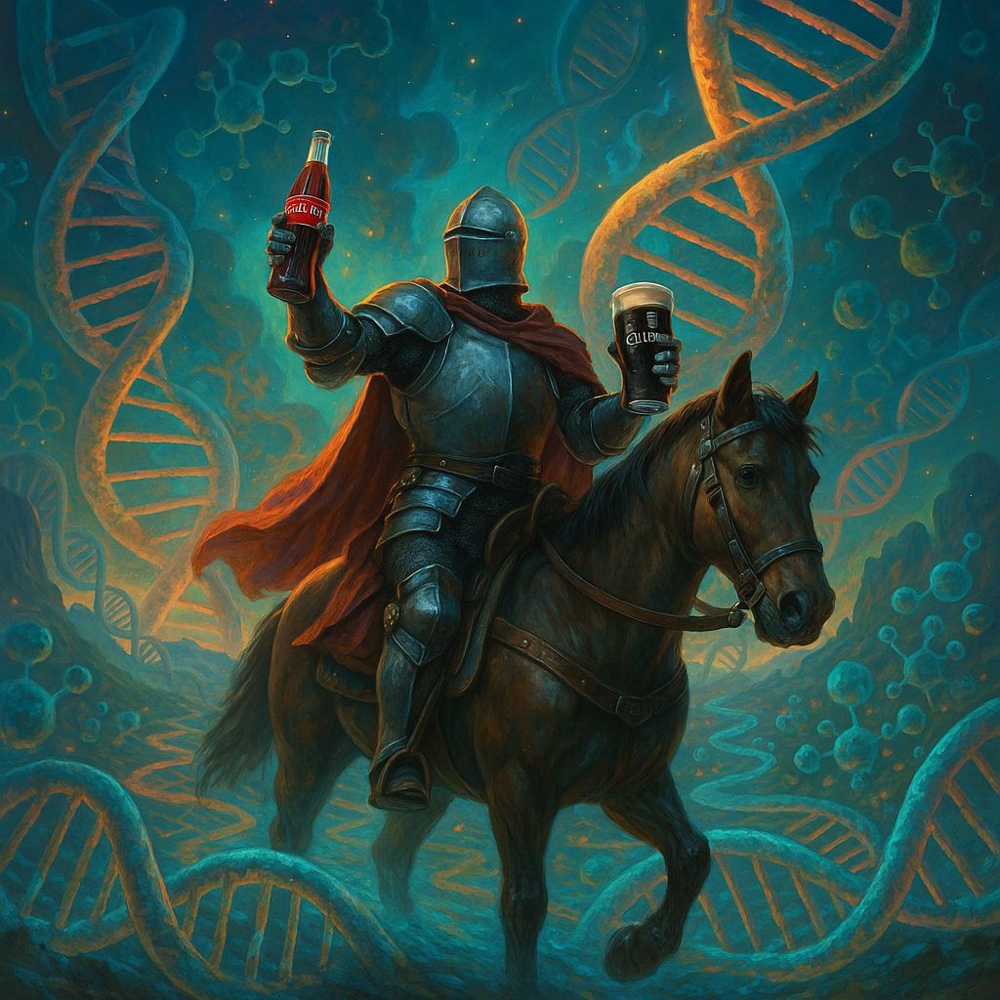

In [1]:
from IPython.display import Image, display
display(Image(filename='data/colaritsar.png'))

## Этап 1. Сбор артефактов знаний (Загрузка датасета)

> **Количество баллов: 5**

Ваша первая задача – собрать необходимые артефакты знаний для вашего путешествия.  Вам потребуется загрузить данные из магического хранилища Hugging Face.

Используйте датасет [InstaDeepAI/genomics-long-range-benchmark](https://huggingface.co/datasets/InstaDeepAI/genomics-long-range-benchmark).

Этот датасет содержит информацию о разных функциональных последовательностях в геноме, что критически важно для понимания регуляции генов.

**Действия:**

> **1.**  Ознакомьтесь с общим описанием датасета на Hugging Face. Приведите ниже свое описание трех любых задач, которые предлагается решить в этом наборе данных, укажите так же биологический смысл последовательностей, которые классифициируются в выбранных трех задачах (*например, энхансеры, кто это, на что влияют, почему важно находить в геноме*).
>
> **2.**  Выберите одну из задач, представленных в датасете.
>
> **3.**  Загрузите выбранный датасет в ваш Jupyter Notebook, используя библиотеку `datasets`. Вам могут понадобиться дополнительные библиотеки и правильная загрузка файла hg38.fa. Загружаем обязательно все данные, не подмножество.
>
> **4.**  Изучите структуру данных и убедитесь, что понимаете, как представлены последовательности ДНК и соответствующие метки, каков баланс классов.

**Критерии оценки:**  
> * Описание датасетов – четкое, своими словами, отражает биологическую значимость   
> * Корректная загрузка – полный датасет, без ошибок, с проверкой структуры  
> * Анализ данных – понимание формата последовательностей и меток  


*Ваше описание датасетов:*
Regulatory Elements Promoter - задача определения участок является промотером или нет. Полезно чтобы выявлять гены, ибо в днк много шлака который не нужен для анализа,  а промотер флаг что инфа важная. Полезно для анализа генома человека (бионфа/биоинж/биофизика и тд)

Regulatory Elements Enhancer - задача определения участок являтся энхансером или нет. Полезно чтобы проанализировать важный участок гена, ибо энхансер дает знак что вот тут надо быть готовым увидеть промотер и после него начать транскрипцию. Полезно для анализа генома человека (бионфа/биоинж/биофизика и тд)

Chromatin Features Histone_Marks - задача классификации фрагментов какие ярлыки на них. Там 20 вариантов меток и надо определить какая из нхи. Метки гистонов могут объясннить что ген активен/готов к активации/не готов к активации/ ваще скипать надо. Это полезно чтобы выявить в геноме учатки активные зоны, предсказывать п последовательность механизмы развития, расшифровать геномные данные и т.д.

variant_effect_pathogenic_clinvar - задача бинарной классификации одиночных нуклеотидных полиморфизмов то есть определить является  ли кодирующий вариат болезнетворным или нейтральным. Полезно для нахождения опасных мутаций, исследоавния механизмов заболеваний генетических и разработки лекарств

я беру промотеры

In [5]:
%pip install pyfaidx

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os

cache_root = "/home/jupyter/datasphere/project/datasetscache"
download_dir = os.path.join(cache_root, "downloads")

print("Does cache root exist?", os.path.isdir(cache_root))
print("Does downloads dir exist?", os.path.isdir(download_dir))

os.makedirs(download_dir, exist_ok=True)

print("After mkdir, exists?", os.path.isdir(download_dir))

Does cache root exist? True
Does downloads dir exist? True
After mkdir, exists? True


In [31]:
%pip install wandb


Defaulting to user installation because normal site-packages is not writeable
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2 MB 4.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━ 3/4 [wandb]-sdk]  WARNING: The scripts wandb and wb are installed in '/home/jupyter/.local/bin' which is not on PATH.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [wandb]

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [40]:
%pip install --upgrade pyarrow


Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [4]:
# место для загрузки датасета

os.makedirs(os.path.join(datasets.config.HF_DATASETS_CACHE, "downloads"), exist_ok=True)

dataset = load_dataset(
    "InstaDeepAI/genomics-long-range-benchmark",
    task_name="regulatory_element_promoter",
    trust_remote_code=True,
    sequence_length=512,
    cache_dir="/home/jupyter/datasphere/project/datasetscache",
)

*Ваше описание загруженных данных:*

In [5]:
print(dataset)

print("Сплиты и их размеры:")
for split in dataset:
    print(f"{split}: {len(dataset[split])} примеров")

DatasetDict({
    train: Dataset({
        features: ['sequence', 'labels', 'chromosome', 'label_start', 'label_stop'],
        num_rows: 953376
    })
    test: Dataset({
        features: ['sequence', 'labels', 'chromosome', 'label_start', 'label_stop'],
        num_rows: 96240
    })
})
Сплиты и их размеры:
train: 953376 примеров
test: 96240 примеров


In [6]:
print("Первый пример из train:")
print(dataset["train"][0])

print("Первый пример из test:")
print(dataset["test"][0])

Первый пример из train:
{'sequence': 'GTTGTCTAAAATGTCTAGTTTTCAATAAAAATTCTTAAGACATGAAAAGAAGCCTAAAAGTGTGACTAGTACACAGGATTAAAAAAAGACACTATCTATAAGGAAACCTAGATATTGGATTTAAGGAAAAAGACCTCAAAGTAGCTGTTATAACTATATTCAAAGAAGTAAAGAAAACAATGCTTAAATAATTTAATTGTGATGACAATAACTCAGAAAATAGAAAATCTCAGTAAATATATAGGAATGTTTGAATAAAGAACCAAATAGAAATTTTGGAGTTGAGAAGTACAATAAATGAAAAGAAAATTTACCAGACAGGCTTGAGCCTGACAGAAAAAAAAATGAATCAATAAGCTTGAAATTGCTCAATTAAAATTATTCAATCTTAAAACTAGGGAGAGGCCAGGCATGGTGGCTCATGCTTGTAATCACAGCAGTAAGGGAGGCCAAGGTGCGTGAATCGCTTGAACCCAGGAGTTCAAGAGCAGCCTGGGCACCATAGCGAGACT', 'labels': 0, 'chromosome': '4', 'label_start': 96648001, 'label_stop': 96648201}
Первый пример из test:
{'sequence': 'GCCCCAACAAGCAAAAACAGGGTCGAAAGGTGGCGTGGGCAGGCTGCAAGGAATCAGGGGTACATTGTGGCCGAAAGAGGGGAGAAGCGGCGAGGCTGCAGGGAATGCTGAGCGACTCCCAAAAAGGCCTGTCTCATCCCAGAAGACCCCAGACTTTTCCGGGTGGGCTGTAAAGCAACAGACTTTGGAGTAGTGTGCCTGTGACTCCCACAGACCTCCACAAGCAAAAATGATATGGGCTGGCATGGGGACTTTGAGGCAGGCAGAGAGAAGAAGCGGCGAGAAAGCATGGAATGCTGGGAGCCTCCCATGGATGCCTCTTTCATCCC

In [7]:
ex = dataset["train"][0]
print(ex["sequence"][:50])
print("Labels:", ex["labels"])
print("Длина sequence:", len(ex["sequence"]))

GTTGTCTAAAATGTCTAGTTTTCAATAAAAATTCTTAAGACATGAAAAGA
Labels: 0
Длина sequence: 512


In [8]:
train_labels = pd.Series(dataset["train"]["labels"])
test_labels = pd.Series(dataset["test"]["labels"])

print("Баланс классов для train:")
print(train_labels.value_counts())
print("Проценты:")
print(train_labels.value_counts(normalize=True) * 100)

print("Баланс классов для test:")
print(test_labels.value_counts())
print("Проценты:")
print(test_labels.value_counts(normalize=True) * 100)

Баланс классов для train:
0    907587
1     45789
Name: count, dtype: int64
Проценты:
0    95.197173
1     4.802827
Name: proportion, dtype: float64
Баланс классов для test:
0    92411
1     3829
Name: count, dtype: int64
Проценты:
0    96.021405
1     3.978595
Name: proportion, dtype: float64


## Этап 2. Алхимические преобразования (Подготовка данных)

> **Количество баллов: 10**

Теперь, когда у вас есть скачанные данные, настало время провести алхимическую магию.  Вам предстоит превратить хаотичные последовательности ДНК в структурированные данные, готовые к употреблению машинным разумом.

**Действия:**

1. **Создание Dataset**

> * Создайте класс датасета на основе родительского класса `Dataset` из библиотеки `pytorch`. 
> * При инициализации обработайте датафрейм данных, подготовьте их к дальнейшей работы нейросетей.
> * Можете воспользоваться кодом из первого семинара в качестве черновика.
> *  Dataset class будет:
>  *  Принимать DataFrame с данными и очищать их.
>  *  Кодировать последовательности ДНК в числовые представления (например, one-hot encoding).
>  *  Возвращать пару (последовательность, метка) для каждого элемента.
> * Не забудьте разделить данные на обучающие и тестовые согласно изначальному разбиению датасета.

1.2  **Параллельная обработка данных**

> * Используйте `Parallel` из `joblib` или `pandas.parallel_apply` (в том числе, например, с `swifter` или `dask`) для параллельной обработки данных. 
> * **Функция очистки данных:** Создайте метод, который будет выполнять следующие преобразования для каждой последовательности ДНК:
>  * Удаление любых символов, кроме `A`, `T`, `G`, `C` (и, возможно, `N` для неопределенных нуклеотидов).
>  * Обрезание последовательностей до фиксированной длины (например, 1000 нуклеотидов).
>  * При необходимости, добавление паддинга (например, символами `N`) к последовательностям, которые короче заданной длины.
>  * Примените эту функцию параллельно ко всем последовательностям в вашем датасете.

2. **Создание Dataloader:**

> *  Используйте `torch.utils.data.DataLoader` для создания батчей данных для обучения.
> *  Cоздайте DataLoader, который будет:
>  *  Использовать созданный Dataset.
>  * Автоматически создавать батчи данных.
>  * Перемешивать данные перед каждой эпохой обучения.
>  * Загружать данные параллельно (num_workers > 0).

**Критерии оценки:**  
> * Создание корректного класса Dataset   
> * Реализация вспомогательных методов, параллелизация
> * Подготовка DataLoader на основе созданных датасетов
> * Ответы на вопросы


**Мудрость архимагов (Ответы на вопросы):**

> *  Для чего используется collate_fn? Приведите примеры, когда он может быть использован.
>  * *(Место для ответа нейросети)*



'''
В PyTorch при загрузке данных через `DataLoader` параметр `collate_fn` позволяет задать собственную функцию «склейки» (collation) отдельных выборок (`samples`) в один батч. По умолчанию PyTorch использует простую функцию, которая превращает список тензоров одинаковой формы в батч, добавляя измерение батча. Но часто данные требуют более сложной предобработки или выравнивания внутри батча. Вот несколько типовых сценариев и примеров.

---

1. Паддинг переменной длины (например, NLP)

В задачах обработки последовательностей (токенов, слов, аудио) длины образцов различаются. Нам нужно дополнить («упаковать») более короткие последовательности до максимальной длины в батче.

```python
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader

def collate_fn_pad(batch):
    # batch — список кортежей (tensor_seq, label)
    sequences, labels = zip(*batch)
    # паддинг по максимальной длине
    padded_seqs = pad_sequence(sequences, batch_first=True, padding_value=0)
    labels = torch.tensor(labels)
    return padded_seqs, labels

loader = DataLoader(dataset,
                    batch_size=32,
                    collate_fn=collate_fn_pad)
```

Здесь `pad_sequence` автоматически дополняет все последовательности до длины самого длинного в батче, а `collate_fn_pad` возвращает уже выровненный батч.

---

2. Фильтрация «плохих» образцов

Иногда в датасете попадаются «битые» данные (например, изображение не загрузилось). Можно отфильтровать их на этапе коллейта:

```python
def collate_fn_filter(batch):
    # отбрасываем None или некорректные примеры
    batch = [sample for sample in batch if sample is not None]
    if len(batch) == 0:
        return None  # или бросаем ошибку
    return default_collate(batch)  # дефолтная склейка

loader = DataLoader(dataset,
                    batch_size=16,
                    collate_fn=collate_fn_filter)
```

---

3. Составные примеры (multi-modal, мультизадачность)

Если один образец содержит сразу несколько типов данных (картинка, текст, табличные признаки), можно в `collate_fn` объединить их по-разному:

```python
def collate_fn_multimodal(batch):
    images, texts, features, labels = zip(*batch)
    # изображения — одинаковый размер, склеиваем по дефолту
    images = torch.stack(images)
    # тексты — пададинг
    texts = pad_sequence(texts, batch_first=True, padding_value=0)
    # табличные фичи — numpy → тензор
    features = torch.tensor(features, dtype=torch.float)
    labels = torch.tensor(labels)
    return {
        'image': images,
        'text': texts,
        'features': features,
    }, labels

loader = DataLoader(multi_modal_dataset,
                    batch_size=8,
                    collate_fn=collate_fn_multimodal)
```

---

4. Аугментация «на лету»

Хотим применять случайное преобразование (например, вращение изображения) к каждому батчу, а не к отдельным сэмплам в датасете:

```python
import torchvision.transforms.functional as F

def collate_fn_augment(batch):
    images, labels = zip(*batch)
    # стек изображений
    images = torch.stack(images)
    # случайный угол
    angle = random.uniform(-30, 30)
    images = F.rotate(images, angle)
    labels = torch.tensor(labels)
    return images, labels

loader = DataLoader(dataset,
                    batch_size=32,
                    collate_fn=collate_fn_augment)
```

---

 5. Взвешенная выборка внутри батча

При дисбалансе классов можно в `collate_fn` динамически подбирать примерны для ровного представления:

```python
from collections import defaultdict
import random

def collate_fn_balanced(batch):
    # группируем по метке
    by_label = defaultdict(list)
    for x, y in batch:
        by_label[y].append((x, y))
    # возьмём по одному из каждого класса
    balanced = []
    for cls_samples in by_label.values():
        balanced.append(random.choice(cls_samples))
    return default_collate(balanced)

loader = DataLoader(dataset,
                    batch_size=64,
                    collate_fn=collate_fn_balanced)
```





>  * Ваши мысли:
Collate_fn дает возможность сконкатить данные в 1 батч, но умно. Его можно (и нужно) юзать когда мы паддим до разной длины, работает со сломанными данными, для нескольких задач одновременно, когда нужно менять данные на лету. Оверолл это вариант как конкатить данные в реальных задачах ибо у нас всегда будут данные разной стуктуры, которые надо приводить 1 вид либо когда нужно менять данные удаляя ненужное, короче это супер база для формирования датасета ибо его альтернатива пайторча ваще не может в такую мобильность


> *  Почему данные на обучении лучше перемешивать в батчах, а в тесте наоборот?
>  **(Место для ответа нейросети)**



При обучении моделей на стохастическом градиентном спуске (SGD) и его производных важно, чтобы каждое обновление весов основывалось на «представительном» и разнообразном наборе примеров. Шаффлинг (перемешивание) данных внутри батчей при обучении решает сразу несколько задач:

1. Снижение корреляции между соседними примерами
   В большинстве датасетов соседние сэмплы могут быть похожи (например, кадры из одного видео, соседние строки в логах и т. п.). Если SGD будет видеть постоянно похожие примеры подряд, градиент уйдёт в «узкую лампу» пространства параметров и обучение станет менее эффективным. Перемешивание убирает эту систематическую корреляцию.

2. Улучшение обобщающей способности
   Рандомизация порядка сэмплов помогает модели избежать «запоминания» порядка, на котором она обучается, и фокусироваться на содержательной составляющей каждого примера. В результате модель лучше обобщает на новые данные.

3. Более плавный градиент
   Каждый батч при перемешивании становится усреднённым по всему датасету, а не по какой-то одной «локальной» группе схожих примеров. Это даёт более стабильные и репрезентативные градиенты, что ускоряет и стабилизирует сходство.

---

 Зачем НЕ перемешивать тестовые/валидационные данные

1. Воспроизводимость результатов
   Для оценки качества модели важно, чтобы метрики (accuracy, F1-score, ROC-AUC и т. д.) всегда вычислялись на одном и том же порядке примеров. Если тестовые данные будут каждый раз перемешиваться по-разному, мы получим слегка разные метрики даже на одной и той же модели.

2. Удобство сопоставления прогнозов и «правды»
   Часто после предсказания хочется пролистать какие-то неудачные примеры, сравнить их с ground-truth и, может быть, визуализировать исходные данные в каком-то фиксированном порядке. Неперемешанный порядок даёт прямое соответствие индексов.

3. Сохранение структурных зависимостей (если есть)
   В задачах с временными рядами, диалогами или иными упорядоченными данными валидация должна проходить на «реальном» порядке сэмплов, чтобы корректно отразить производительность в боевых условиях.

---

>  * Ваши мысли:
Перемешкивать трейн надо чтобы у нас были разнообразные данные (они же могли собраться по какому то порядку и тогда просто оверфитт обеспечен) для снижении корреляции между примерами и ускорить обучение. Так же градиент будет более плавный во время град спуска для подбора оптимальных весов. Тем временем тестовые данные перемшкивать не надо ибо нам важно чтобы резы были воспроизводимы всегда то есть чтобы метрики считали на одном и том же порядке примеровm это очень важно для правильного анализа качества модели! Ну и плюс есть прям случаи когда нельзя перемешкивать условно врем. ряды.    

In [9]:
class GenomicDataset(Dataset):
    def __init__(self, df: pd.DataFrame, seq_len: int = 512, n_jobs: int = 4):
        self.seq_len = seq_len
        self.labels = df["labels"].astype(np.int64).tolist()
        sequences = df["sequence"].tolist()

        self.clean_seqs = Parallel(n_jobs=n_jobs)(
            delayed(self._clean_seq)(seq)
            for seq in tqdm(sequences, desc="Cleaning sequences")
        )

        self.encoded = [
            self._encode_onehot(seq)
            for seq in tqdm(self.clean_seqs, desc="Encoding sequences")
        ]

    def _clean_seq(self, seq: str) -> str:
        seq = re.sub(r"[^ATGCN]", "N", seq.upper())
        if len(seq) > self.seq_len:
            return seq[: self.seq_len]
        else:
            return seq + "N" * (self.seq_len - len(seq))

    def _encode_onehot(self, seq: str) -> torch.Tensor:
        mapping = {"A": 0, "C": 1, "G": 2, "T": 3, "N": 4}
        arr = np.zeros((5, self.seq_len), dtype=np.float32)
        for i, nt in enumerate(seq):
            arr[mapping.get(nt, 4), i] = 1.0
        return torch.from_numpy(arr)

    def __len__(self):
        return len(self.encoded)

    def __getitem__(self, idx):
        return self.encoded[idx], torch.tensor(self.labels[idx])

In [10]:
df_train = dataset["train"].to_pandas()
df_test = dataset["test"].to_pandas()

In [11]:
train_ds = GenomicDataset(df_train, seq_len=512, n_jobs=4)
test_ds = GenomicDataset(df_test, seq_len=512, n_jobs=4)

Encoding sequences: 100%|██████████| 96240/96240 [00:09<00:00, 10282.07it/s]


In [11]:
import multiprocessing

multiprocessing.cpu_count()

28

In [12]:
import random

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [13]:
train_loader = DataLoader(
    train_ds,
    batch_size=64,
    shuffle=True,
    num_workers=26,
    pin_memory=True,
    worker_init_fn=lambda wid: np.random.seed(SEED + wid)
        or random.seed(SEED + wid),
)
test_loader = DataLoader(
    test_ds,
    batch_size=64,
    shuffle=False,
    num_workers=26,
    pin_memory=True,
    worker_init_fn=lambda wid: np.random.seed(SEED + wid) or random.seed(SEED + wid),
)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 26 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 26 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [14]:
for batch in train_loader:
    print("batch:", [t.shape for t in batch])
    break

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 26 worker processes in total. Our suggested max number of worker in current system is 8, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


batch: [torch.Size([64, 5, 512]), torch.Size([64])]


Теперь у вас есть хорошо подготовленные данные, готовые к обучению могущественной нейросети! Переходите к следующему этапу!

## Этап 3. Сотворение голема (Построение нейросети)

> **Количество баллов: 5**
>
> **Бонус за графовую сеть: 15**

Пришло время воплотить ваши знания в жизнь и создать могущественного помощника, голема - нейронную сеть, способную распознавать закономерности в ДНК. Подобно средневековым алхимикам, вы будете комбинировать различные ингредиенты (слои, функции активации, регуляризаторы) для создания архитектуры, которая превзойдет все ожидания!

**Действия:**

1.  **Выбор архитектуры:**

> *   Вы вольны выбирать любую архитектуру нейронной сети, которая, по вашему мнению, наилучшим образом подходит для решения поставленной задачи. Рассмотрите следующие варианты:
>  *   **Сверточные нейронные сети (CNN):** Хорошо подходят для обнаружения локальных мотивов в последовательностях ДНК. Могут оказаться слабыми для общей задачи.
>  *  **(Продвинутый уровень) [Графовые нейронные сети](https://pytorch-geometric.readthedocs.io/en/latest/modules/nn.html):** Рассмотрите возможность использования графовой свертки вместо классической. В качестве аргументов метода класса при инициализации должно быть возможным выбирать тип графовой свертки, а при запусках forward метода экспереминтировать с ребрами графов. 

2.  **Создание архитектуры:**

> *   Создайте класс для вашей нейронной сети.
> *   Ваша нейронная сеть должна включать в себя следующие аргументы при инициализации, чтобы их можно было в дальнейшем подбирать:
>  *  **Сверточные слои (если выбрана CNN):**
>        *   Настройте количество сверточных слоев.
>        *   Настройте количество фильтров в каждом слое.
>        *   Настройте размер ядра свертки в каждом слое.
>        *   Настройте stride и padding в каждом слое.
>  *  **Графовые слои (если выбрана GNN):**
>        *   Тип графового сверточного слоя.
>        *   Параметры для каждого типа графового сверточного слоя (см. документация).
>  *   **Функции активации:**
>        *   Используйте различные функции активации (ReLU, Sigmoid, Tanh, LeakyReLU и т.д.).
>  *   **Нормализация:**
>        *   Используйте batch normalization или layer normalization для ускорения обучения и повышения устойчивости.
>  *   **Dropout:**
>        *   Используйте dropout для предотвращения переобучения.
>  *  **Линейные слои (Fully Connected Layers):**
>        *   Добавьте несколько линейных слоев в конце сети для классификации или регрессии.
>
> *   **Целью является достижение максимально высокого качества предсказаний.** 
>
> *   **Важно:** Ваша нейронная сеть должна иметь **достаточное количество гиперпараметров, которые можно будет настраивать** на следующем этапе (оптимизация гиперпараметров).  Это позволит вам гибко настраивать архитектуру сети для достижения оптимальной производительности.

3.  **Семинарский код:**

> *   Вы можете использовать код одной из моделей, представленных на семинаре, в качестве отправной точки.
> *   **Но!**  Убедитесь, что вы понимаете, как работает каждая часть кода, и что ваша модель удовлетворяет всем требованиям, указанным выше (максимальное количество настраиваемых гиперпараметров, различные типы слоев, нормализация, dropout и т.д.).

**Критерии оценки**

> * Корректно реализованная архитектура нейронной сети с широким числом настраиваемых гиперпараметров
> * Реализация графовой нейросети

In [15]:
class GenomicCNNClassifier(nn.Module):
    def __init__(
        self,
        seq_len: int = 512,
        in_channels: int = 5,
        num_classes: int = 2,
        conv_configs: list = None,
        activation: str = "ReLU",  
        norm_type: str = "batch",  
        dropout: float = 0.5,
        fc_hidden_dims: list = [128, 64],
    ):
        super().__init__()
        if conv_configs is None:
            conv_configs = [
                {"out_channels": 64, "kernel_size": 7, "stride": 1, "padding": 3},
                {"out_channels": 128, "kernel_size": 5, "stride": 1, "padding": 2},
            ]

        activations = {
            "relu": nn.ReLU(),
            "leakyrelu": nn.LeakyReLU(),
            "tanh": nn.Tanh(),
            "sigmoid": nn.Sigmoid(),
        }
        act = activations.get(activation.lower(), nn.ReLU())

        self.conv_blocks = nn.ModuleList()
        curr_len = seq_len
        in_ch = in_channels
        for cfg in conv_configs:
            out_ch = cfg["out_channels"]
            k = cfg["kernel_size"]
            s = cfg.get("stride", 1)
            p = cfg.get("padding", k // 2)

            conv = nn.Conv1d(in_ch, out_ch, kernel_size=k, stride=s, padding=p)

            if norm_type == "batch":
                norm = nn.BatchNorm1d(out_ch)
            else:
                new_len = math.floor((curr_len + 2 * p - k) / s) + 1
                norm = nn.LayerNorm([out_ch, new_len])

            block = nn.Sequential(
                conv,
                norm,
                act,
                nn.Dropout(dropout),
            )
            self.conv_blocks.append(block)

            curr_len = math.floor((curr_len + 2 * p - k) / s) + 1
            in_ch = out_ch

        conv_out_dim = in_ch * curr_len

        fc_layers = []
        last_dim = conv_out_dim
        for h in fc_hidden_dims:
            fc_layers += [
                nn.Linear(last_dim, h),
                nn.BatchNorm1d(h) if norm_type == "batch" else nn.LayerNorm(h),
                act,
                nn.Dropout(dropout),
            ]
            last_dim = h
        fc_layers.append(nn.Linear(last_dim, num_classes))
        self.fc = nn.Sequential(*fc_layers)

    def forward(self, x: torch.Tensor):
        for block in self.conv_blocks:
            x = block(x)
        x = x.view(x.size(0), -1)
        logits = self.fc(x)
        return logits

Теперь ваш голем готов! На следующем этапе вы вдохнете в него жизнь, обучая его на ценных знаниях, извлеченных из ДНК.

## Этап 4. Первое сражение (Обучение и Испытание)

> **Количество баллов: 5**

Пришло время вывести вашу нейронную армию на поле битвы! Под вашим командованием они сразятся с хаосом неструктурированных данных, обучаясь распознавать вражеские закономерности. Закалите их в горниле тренировок, чтобы они стали непобедимы!

**Действия:**

1.  **Вооружение войск:**

> * **Простым языком:** выберите для первого запуска обучения и тестирования **(1)** optimizer, **(2)** scheduler, **(3)** loss function **(4)** device **(5)** n_epochs.
> * **Рыцарским языком:**
>   *   **Благословение Энтропии (Функция потерь):** Изберите подходящее заклинание энтропии для вашей армии. Поскольку вы сражаетесь в области бинарной классификации (предсказание наличия или отсутствия вражеского элемента), наиболее подходящим будет `torch.nn.BCEWithLogitsLoss()` (Binary Cross-Entropy with Logits Loss). Оно объединяет в себе силу сигмоидной трансформации и энергию перекрестной энтропии..
>   *   **Эликсир Скорости (Оптимизатор):** Выберите эликсир скорости (оптимизатор - `Adam`, `SGD`, `RMSprop`), чтобы ваши войска могли маневрировать быстрее и точнее. Настройте дозировку эликсира (learning rate) и другие его свойства.
>   *   **Поле Битвы (Устройство):** Определите, где будет развернута битва – на тренировочном полигоне (CPU) или на арене мощи (GPU).

2.  **Цикл Сражения:**

> *   Напишите код функий для обучения, тестирования и логгирования вашей нейронной сети.
> *   Внутри цикла:
>  *   Переместите войска (входные последовательности) на выбранное поле битвы (CPU или GPU).
>  *   Выполните прямой проход через нейронную сеть, чтобы получить предсказания.
>  *   Вычислите потери армии (функцию потерь).
>  *   Отправьте ударную волну (backpropagation), чтобы вычислить направления для улучшения войск.
>  *   Усильте войска (обновите параметры модели с помощью оптимизатора).
> *   После каждой эпохи или через определенные интервалы:
>  *   Оцените алгоритм на тестовой выборке.
>  *   Вычислите доблесть войска, измерив:
>        *  Accuracy
>        *  Precision
>        *  Recall
>        *  F1-score
>        *  AUC-ROC
>        *  Значение ошибки
>        *  Значение learning rate

3.  **Хроники Побед (WandB Логирование):**

> *   Запишите ход битвы в Хроники Побед (WandB):
>  *   `wandb.init(project="Ваш проект")`
> *   Запишите все сохраненные метрики для графиков.

4.  **Семинарский код:**

> *   Вы можете использовать код функций обучения и тестирования, представленные на семинаре, в качестве отправной точки.
> *   **Но!**  Убедитесь, что вы понимаете, как работает каждая часть кода, и что функции удовлетворяют всем требованиям, указанным выше.

**Критерии оценки**

> * Корректно реализованные функции обучения, тестирования и создания графиков
> * Работоспособность всего кода, правильно созданные и переданные параметры обучения
> * Логирование всего процесса
> * Корректно считающиеся метрики, наличие графиков обучения
> * Достаточное кол-во эпох обучения для достижения разумных метрик качества, обучение модели как таковое

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
n_epochs = 10
learning_rate = 1e-3

In [16]:
model = GenomicCNNClassifier(
    seq_len=512,
    in_channels=5,
    num_classes=1,  
    conv_configs=[
        {"out_channels": 64, "kernel_size": 7, "stride": 1, "padding": 3},
        {"out_channels": 128, "kernel_size": 5, "stride": 1, "padding": 2},
        {"out_channels": 256, "kernel_size": 3, "stride": 1, "padding": 1},
    ],
    activation="ReLU",
    norm_type="batch",
    dropout=0.3,
    fc_hidden_dims=[256, 128],
)
model.to(device)

GenomicCNNClassifier(
  (conv_blocks): ModuleList(
    (0): Sequential(
      (0): Conv1d(5, 64, kernel_size=(7,), stride=(1,), padding=(3,))
      (1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout(p=0.3, inplace=False)
    )
    (1): Sequential(
      (0): Conv1d(64, 128, kernel_size=(5,), stride=(1,), padding=(2,))
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout(p=0.3, inplace=False)
    )
    (2): Sequential(
      (0): Conv1d(128, 256, kernel_size=(3,), stride=(1,), padding=(1,))
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout(p=0.3, inplace=False)
    )
  )
  (fc): Sequential(
    (0): Linear(in_features=131072, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3

In [ ]:
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
scheduler = StepLR(optimizer, step_size=5, gamma=0.5)

In [ ]:
wandb.login(key="b1215b084a90e01ab65eecf44b19f7897f160b41")
wandb.init(
    project="genomics-cnn-battle",
    config={
        "epochs": n_epochs,
        "lr": learning_rate,
        "optimizer": "Adam",
        "scheduler": "StepLR(5,0.5)",
        "batch_size": train_loader.batch_size,
    },
)
wandb.watch(model, log="all", log_freq=50)


def train_one_epoch(model, loader):
    model.train()
    total_loss = 0.0
    all_probs, all_labels = [], []

    for X, y in tqdm(loader, desc="Train", leave=False):
        X = X.to(device)
        y = y.to(device).float()

        optimizer.zero_grad()
        logits = model(X).squeeze(1)  
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * X.size(0)
        probs = torch.sigmoid(logits).detach().cpu().numpy()
        all_probs.extend(probs)
        all_labels.extend(y.cpu().numpy())

    scheduler.step()
    return all_probs, all_labels, total_loss / len(loader.dataset)


def eval_model(model, loader):
    model.eval()
    total_loss = 0.0
    all_probs, all_labels = [], []

    with torch.no_grad():
        for X, y in tqdm(loader, desc="Eval ", leave=False):
            X = X.to(device)
            y = y.to(device).float()

            logits = model(X).squeeze(1)
            loss = criterion(logits, y)
            total_loss += loss.item() * X.size(0)

            probs = torch.sigmoid(logits).cpu().numpy()
            all_probs.extend(probs)
            all_labels.extend(y.cpu().numpy())

    return all_probs, all_labels, total_loss / len(loader.dataset)


for epoch in range(1, n_epochs + 1):
    train_probs, train_labels, train_loss = train_one_epoch(model, train_loader)
    test_probs, test_labels, test_loss = eval_model(model, test_loader)

    train_pred = (np.array(train_probs) >= 0.5).astype(int)
    test_pred = (np.array(test_probs) >= 0.5).astype(int)

    metrics = {
        "epoch": epoch,
        "train/loss": train_loss,
        "train/accuracy": accuracy_score(train_labels, train_pred),
        "train/precision": precision_score(train_labels, train_pred),
        "train/recall": recall_score(train_labels, train_pred),
        "train/f1": f1_score(train_labels, train_pred),
        "train/auc": roc_auc_score(train_labels, train_probs),
        "test/loss": test_loss,
        "test/accuracy": accuracy_score(test_labels, test_pred),
        "test/precision": precision_score(test_labels, test_pred),
        "test/recall": recall_score(test_labels, test_pred),
        "test/f1": f1_score(test_labels, test_pred),
        "test/auc": roc_auc_score(test_labels, test_probs),
        "lr": optimizer.param_groups[0]["lr"],
    }

    wandb.log(metrics, step=epoch)

    print(f"\nEpoch {epoch}/{n_epochs}  —  LR: {metrics['lr']:.2e}")
    print(
        f" Train loss: {metrics['train/loss']:.4f}  |  Test loss: {metrics['test/loss']:.4f}"
    )
    print(
        f" Train Acc: {metrics['train/accuracy']:.4f}  Prec: {metrics['train/precision']:.4f}  "
        f"Rec: {metrics['train/recall']:.4f}  F1: {metrics['train/f1']:.4f}  AUC: {metrics['train/auc']:.4f}"
    )
    print(
        f" Test  Acc: {metrics['test/accuracy']:.4f}  Prec: {metrics['test/precision']:.4f}  "
        f"Rec: {metrics['test/recall']:.4f}  F1: {metrics['test/f1']:.4f}  AUC: {metrics['test/auc']:.4f}\n"
    )

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /home/jupyter/.netrc
wandb: Currently logged in as: romanbokhyan (romanbokhyan-hse-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: creating run
wandb: Tracking run with wandb version 0.20.1
wandb: Run data is saved locally in /home/jupyter/work/resources/DLNaturalScience/Biology/wandb/run-20250619_150727-mp9xmezd
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run misty-energy-9
wandb: ⭐️ View project at https://wandb.ai/romanbokhyan-hse-university/genomics-cnn-battle
wandb: 🚀 View run at https://wandb.ai/romanbokhyan-hse-university/genomics-cnn-battle/runs/mp9xmezd



Epoch 1/10  —  LR: 1.00e-03
 Train loss: 0.0960  |  Test loss: 0.0766
 Train Acc: 0.9712  Prec: 0.7776  Rec: 0.5611  F1: 0.6518  AUC: 0.9352
 Test  Acc: 0.9774  Prec: 0.8604  Rec: 0.5166  F1: 0.6456  AUC: 0.9514




Epoch 2/10  —  LR: 1.00e-03
 Train loss: 0.0877  |  Test loss: 0.0756
 Train Acc: 0.9736  Prec: 0.8057  Rec: 0.5940  F1: 0.6838  AUC: 0.9489
 Test  Acc: 0.9776  Prec: 0.8608  Rec: 0.5202  F1: 0.6485  AUC: 0.9558




Epoch 3/10  —  LR: 1.00e-03
 Train loss: 0.0845  |  Test loss: 0.0745
 Train Acc: 0.9742  Prec: 0.8108  Rec: 0.6048  F1: 0.6928  AUC: 0.9545
 Test  Acc: 0.9794  Prec: 0.8266  Rec: 0.6114  F1: 0.7029  AUC: 0.9577




Epoch 4/10  —  LR: 1.00e-03
 Train loss: 0.0817  |  Test loss: 0.0750
 Train Acc: 0.9747  Prec: 0.8143  Rec: 0.6124  F1: 0.6990  AUC: 0.9589
 Test  Acc: 0.9782  Prec: 0.8576  Rec: 0.5424  F1: 0.6645  AUC: 0.9570




Epoch 5/10  —  LR: 5.00e-04
 Train loss: 0.0779  |  Test loss: 0.0743
 Train Acc: 0.9753  Prec: 0.8179  Rec: 0.6245  F1: 0.7082  AUC: 0.9647
 Test  Acc: 0.9794  Prec: 0.8147  Rec: 0.6237  F1: 0.7065  AUC: 0.9552




Epoch 6/10  —  LR: 5.00e-04
 Train loss: 0.0696  |  Test loss: 0.0776
 Train Acc: 0.9767  Prec: 0.8257  Rec: 0.6536  F1: 0.7296  AUC: 0.9748
 Test  Acc: 0.9781  Prec: 0.7683  Rec: 0.6425  F1: 0.6998  AUC: 0.9510




Epoch 7/10  —  LR: 5.00e-04
 Train loss: 0.0632  |  Test loss: 0.0891
 Train Acc: 0.9781  Prec: 0.8270  Rec: 0.6878  F1: 0.7510  AUC: 0.9810
 Test  Acc: 0.9750  Prec: 0.6885  Rec: 0.6782  F1: 0.6833  AUC: 0.9478




Epoch 8/10  —  LR: 5.00e-04
 Train loss: 0.0583  |  Test loss: 0.1491
 Train Acc: 0.9791  Prec: 0.8298  Rec: 0.7116  F1: 0.7662  AUC: 0.9848
 Test  Acc: 0.9420  Prec: 0.3782  Rec: 0.7125  F1: 0.4941  AUC: 0.9324




Epoch 9/10  —  LR: 5.00e-04
 Train loss: 0.0537  |  Test loss: 0.1949
 Train Acc: 0.9804  Prec: 0.8313  Rec: 0.7425  F1: 0.7844  AUC: 0.9877
 Test  Acc: 0.9037  Prec: 0.2626  Rec: 0.7856  F1: 0.3936  AUC: 0.9325




Epoch 10/10  —  LR: 2.50e-04
 Train loss: 0.0496  |  Test loss: 0.3074
 Train Acc: 0.9817  Prec: 0.8372  Rec: 0.7685  F1: 0.8014  AUC: 0.9897
 Test  Acc: 0.8289  Prec: 0.1677  Rec: 0.8329  F1: 0.2792  AUC: 0.9118



очевидный оверфитинг начинается ибо трейн лосс падает а на тесте стремится куда то в небесе

Лучшая эпоха по F1-score: Epoch 5 (F1 = 0.71)


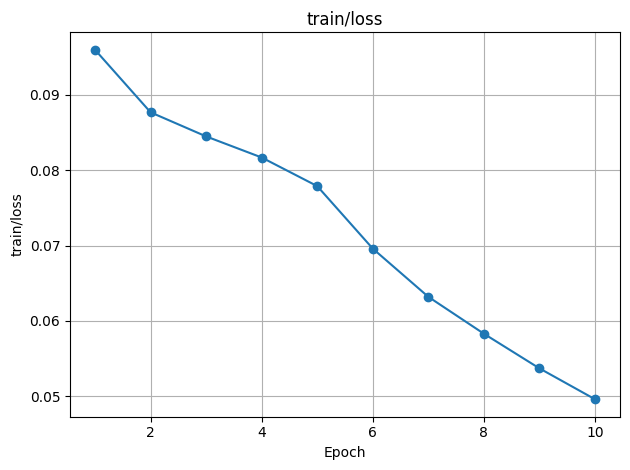

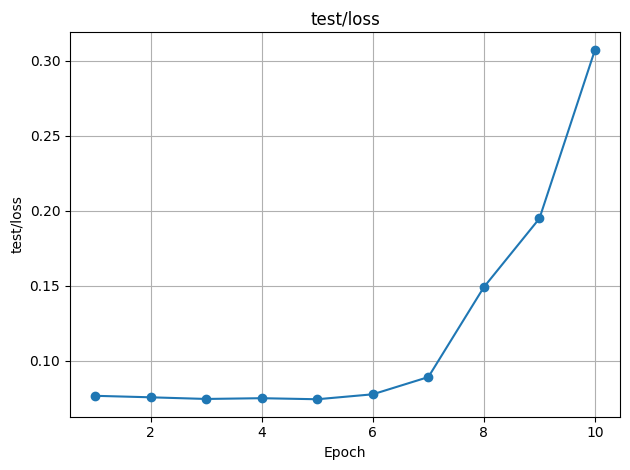

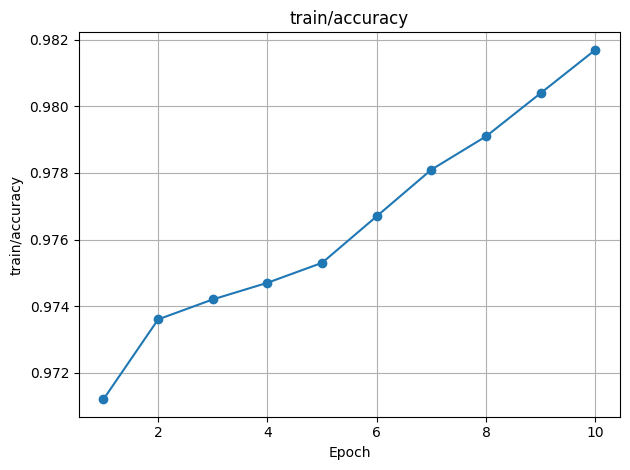

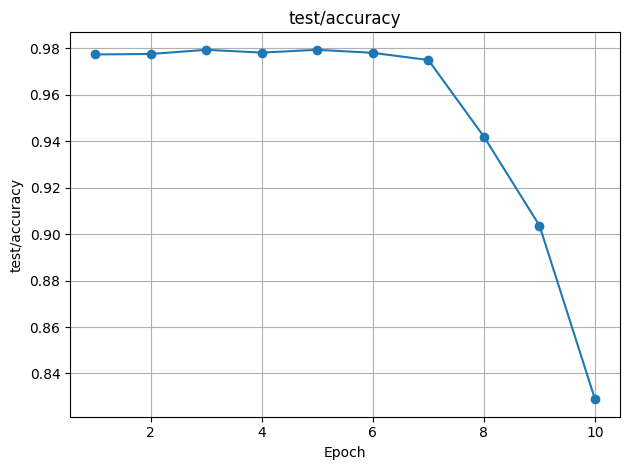

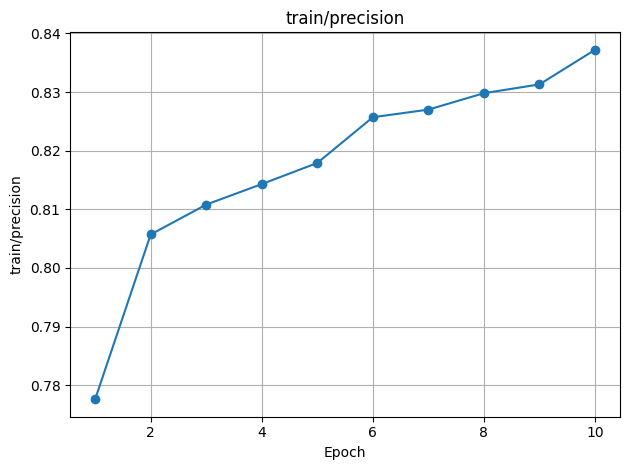

...

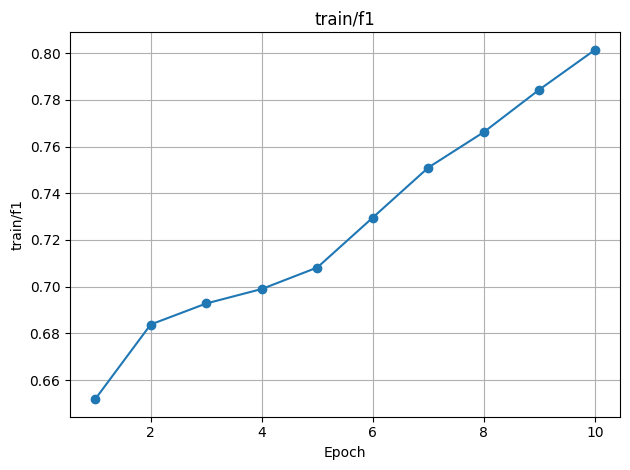

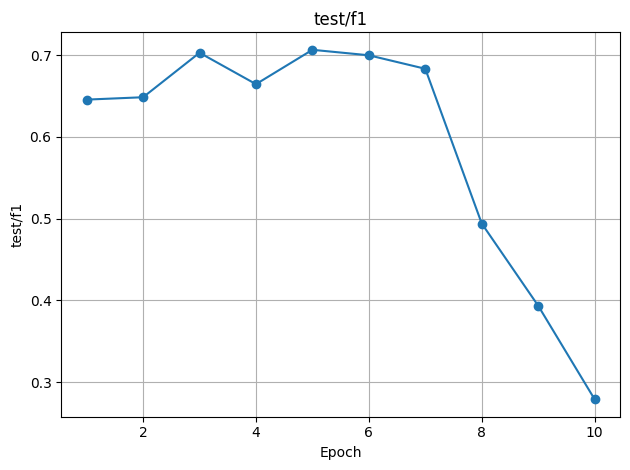

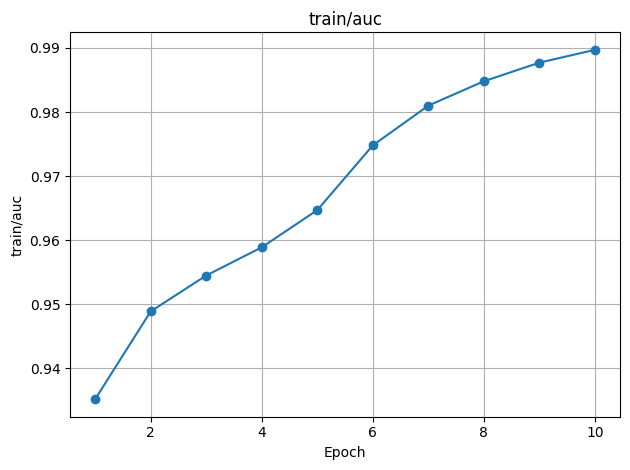

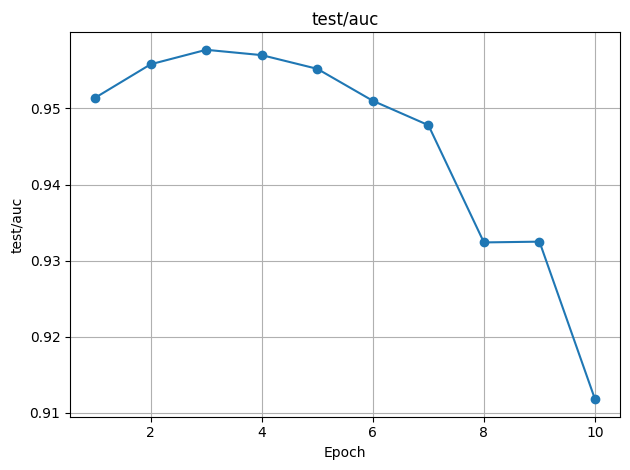

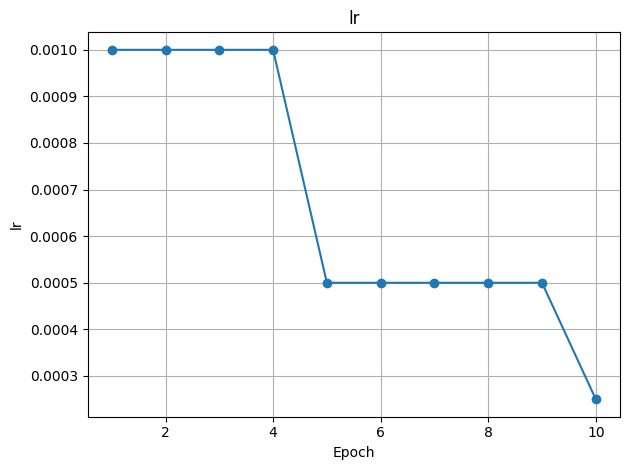

In [20]:
import numpy as np

history = {
    "train/loss": [
        0.0960,
        0.0877,
        0.0845,
        0.0817,
        0.0779,
        0.0696,
        0.0632,
        0.0583,
        0.0537,
        0.0496,
    ],
    "test/loss": [
        0.0766,
        0.0756,
        0.0745,
        0.0750,
        0.0743,
        0.0776,
        0.0891,
        0.1491,
        0.1949,
        0.3074,
    ],
    "train/accuracy": [
        0.9712,
        0.9736,
        0.9742,
        0.9747,
        0.9753,
        0.9767,
        0.9781,
        0.9791,
        0.9804,
        0.9817,
    ],
    "test/accuracy": [
        0.9774,
        0.9776,
        0.9794,
        0.9782,
        0.9794,
        0.9781,
        0.9750,
        0.9420,
        0.9037,
        0.8289,
    ],
    "train/precision": [
        0.7776,
        0.8057,
        0.8108,
        0.8143,
        0.8179,
        0.8257,
        0.8270,
        0.8298,
        0.8313,
        0.8372,
    ],
    "test/precision": [
        0.8604,
        0.8608,
        0.8266,
        0.8576,
        0.8147,
        0.7683,
        0.6885,
        0.3782,
        0.2626,
        0.1677,
    ],
    "train/recall": [
        0.5611,
        0.5940,
        0.6048,
        0.6124,
        0.6245,
        0.6536,
        0.6878,
        0.7116,
        0.7425,
        0.7685,
    ],
    "train/f1": [
        0.6518,
        0.6838,
        0.6928,
        0.6990,
        0.7082,
        0.7296,
        0.7510,
        0.7662,
        0.7844,
        0.8014,
    ],
    "test/f1": [
        0.6456,
        0.6485,
        0.7029,
        0.6645,
        0.7065,
        0.6998,
        0.6833,
        0.4941,
        0.3936,
        0.2792,
    ],
    "train/auc": [
        0.9352,
        0.9489,
        0.9545,
        0.9589,
        0.9647,
        0.9748,
        0.9810,
        0.9848,
        0.9877,
        0.9897,
    ],
    "test/auc": [
        0.9514,
        0.9558,
        0.9577,
        0.9570,
        0.9552,
        0.9510,
        0.9478,
        0.9324,
        0.9325,
        0.9118,
    ],
    "lr": [
        0.0010,
        0.0010,
        0.0010,
        0.0010,
        0.0005,
        0.0005,
        0.0005,
        0.0005,
        0.0005,
        0.00025,
    ],
}

for metric_name, values in history.items():
    plt.figure()
    plt.plot(range(1, len(values) + 1), values, marker="o")
    plt.title(metric_name)
    plt.xlabel("Epoch")
    plt.ylabel(metric_name)
    plt.grid(True)
    plt.tight_layout()

test_f1 = np.array(history["test/f1"])
best_idx = np.argmax(test_f1)
best_epoch = best_idx + 1
best_value = test_f1[best_idx]

print(f"Лучшая эпоха по F1-score: Epoch {best_epoch} (F1 = {best_value:.2f})")

plt.show()

Таким образом моя модель выдала F1 0.71 на задаче промотеров. На самом деле это очень крутой рез ибо если сравниться с моделями которые тестили ИМЕННО на этом датасете то их всего две (вроде) - NTv2 и Кадецеус. Обе модели ЛЛМ, первая трансформер вторая SSM и у них результат 0.75 и 0.77 соотвественно. Тот факт что моя архитектура стоит вровень с крутыми трансформерми показывает что архитектурно я подобрал крутой вариант. А если сравниться просто с моделями которые обучали на такую задачу, но другой датасет то там в среднем все в интервале [+- 0.67 и +- 0.8] так что в итоге модель круто обучилась, превзойдя несколько серьезных моделей которые обучали намного суровее, но мой рез  и подход оказался лучше, но очевидно никакая не сота в задаче, но и такой рез мегатоп имхо (я не ожидал просто ахахах)

## Этап 5. Совет Мудрецов (Тонкая настройка гиперпараметров с Optuna)

> **Количество баллов: 15**

Ваша нейронная армия прошла боевое крещение, но чтобы превратить ее в непобедимую силу, требуется мудрость древних! Пришло время обратиться к Совету Мудрецов (Optuna), который поможет вам отточить каждую деталь вашей стратегии и вооружения.

**Ваша миссия:** Использовать Optuna для поиска оптимальной комбинации гиперпараметров, которые раскроют истинный потенциал вашей модели.

**Действия:**
1. Создайте функцию `objective(trial)` для Optuna, где:
>   - Определите пространство поиска всех ключевых гиперпараметров, **например**:
>     * Тип оптимизатора (Adam, SGD, RMSprop)
>     * Learning rate (логарифмический масштаб 1e-5 - 1e-2), weight_decay
>     * lr_scheduler
>     * Количество эпох 
>     * Размер батча 
>     * Параметры архитектуры (количество слоёв, размерность скрытых слоёв, dropout)
>   - Инициализируйте модель с предложенными параметрами
>   - Обучите модель и верните значение целевой метрики (F1-score)

2. Проведите оптимизацию:
```python
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)
```

3. После поиска:
>   - Обучите финальную модель с лучшими параметрами
>   - Визуализируйте процесс оптимизации:
>     ```python
     optuna.visualization.plot_optimization_history(study)
     optuna.visualization.plot_param_importances(study)
>     ```

4. Зафиксируйте результаты в WandB:
>   ```python
>   wandb.log({"best_params": study.best_params})
>   ```

**Критерии оценки:**
>- Корректность реализации функции objective
>- Разнообразие исследуемых гиперпараметров
>- Улучшение метрики качества по сравнению с базовой моделью
>- Визуализация результатов оптимизации
>- Ответы на вопросы

**Вопросы для Мудрецов:**

>**Вопрос 1:** Что такое "trial" в контексте Optuna и какую роль он играет в процессе оптимизации? 
>
> * *(Место для ответа нейросети)*

В контексте Optuna trial (рус. «пробный запуск») — это одна итерация процесса поиска оптимальных гиперпараметров, на которой:

    Генерируются конкретные значения гиперпараметров
    При создании trial Optuna вызывает методы trial.suggest_int(), trial.suggest_float(), trial.suggest_categorical() и т. д. Самплер (например, по умолчанию TPE Sampler) на основании предыдущих результатов подбирает новые точки в пространстве гиперпараметров.

    Вычисляется значение целевой функции
    Сгенерированные гиперпараметры передаются в вашу функцию objective, внутри которой вы обучаете модель и вычисляете метрику (например, accuracy, loss или AUC). Результат возвращается обратно в Optuna.

    Фиксируются результаты и обновляется стратегия поиска
    Optuna сохраняет пару «набор гиперпараметров → значение метрики» в объекте Study. Затем самплер использует накопленную информацию о предыдущих trials, чтобы предложить в следующий раз более «перспективные» гиперпараметры.

    Опционально применяется прунер (Pruner)
    В процессе trial можно вызывать trial.report() и при необходимости завершать неудачные запуски досрочно через trial.should_prune(). Это позволяет экономить ресурсы, прерывая явно нерезультативные конфигурации.

> * Ваши мысли: (*Объясните своими словами, как концепция trial помогает в поиске оптимальных параметров*)
траел это 1 итерация поиска оптимальных гиперпараметров, он работает так что он подбирает набор гиперпарамтеров запускает модель и чекает качество. Ну и так он делает n раз и по итогу находит оптимальные гиперпарамтеры. Как бы сделаю очев помарку поч оно ваще есть - нельзя подбирать гиперпараметры во время обучения ибо будет подгон а вот оптуна помогает подбирать не на рандом/чуйку

---

>**Вопрос 2:** Кто такой Pruner в optuna? Как он помогает подобрать гиперпараметры?
>
> * *(Место для ответа нейросети)*

Pruner в Optuna — это модуль раннего отсечения неудачных trials. Во время выполнения trial вы можете вызывать trial.report() для передачи промежуточной метрики, а Pruner по этой информации решает через trial.should_prune(), стоит ли прервать этот trial досрочно. Благодаря этому Optuna не тратит время на явно плохие комбинации гиперпараметров и быстрее фокусируется на перспективных.


> * Ваши мысли:
Прунер помогает подобрать гиперпараметры эффективно то есть не заостряет внимание на очевидно плохой комбинации и существует ради этого
---

>**Вопрос 3:** Какие методы сэмплирования (sampling) доступны в Optuna и в каких случаях их следует использовать?
> * *(Место для ответа нейросети)*


В Optuna есть несколько встроенных методов сэмплирования (sampler), каждый из которых подходит для разных задач:

    TPESampler (Tree-structured Parzen Estimator)
    – Что делает: байесовская оптимизация: строит непараметрические оценки плотностей «хороших» и «плохих» точек в истории trials и генерирует новые параметры, максимизируя соотношение полезности.
    – Когда применять: когда оценки функции дорогие (обучение тяжёлой модели), и хочется «умнее» искать пространство гиперпараметров с учётом накопленных результатов (чаще всего — выбор по умолчанию в Optuna).

    RandomSampler
    – Что делает: выбирает параметры равномерно случайно в заданных диапазонах.
    – Когда применять: для «грубых» первоначальных проб, бенчмарков, когда важно получить непредвзятую выборку или когда структура функции полностью неизвестна.

    CmaEsSampler (Covariance Matrix Adaptation Evolution Strategy)
    – Что делает: эволюционный алгоритм, поддерживает коваринс-матрицу распределения для адаптивного поиска.
    – Когда применять: для непрерывных, многомерных пространств, где предполагается гладкая (евклидово-похожая) геометрия функции, и нужны глобальные стратегии без градиентов.

    GridSampler
    – Что делает: полный перебор («grid search») по заранее заданным точкам сетки.
    – Когда применять: когда размеры пространства малы и важно исследовать все сочетания (например, 2–3 дискретных гиперпараметра с небольшим числом значений).

    NSGAIISampler (Non-dominated Sorting Genetic Algorithm II)
    – Что делает: эволюционный алгоритм для многокритериальной оптимизации, поддерживает поиск компромиссов (пары гиперпараметров → вектор метрик).
    – Когда применять: если ваша задача имеет две и более метрики (например, одновременно минимизировать loss и время обучения) и нужен фронт Парето.

    MOTPESampler (Multi-Objective TPE)
    – Что делает: расширение TPESampler на многокритериальную постановку, строит байесовские модели для каждого критерия и ищет баланс.
    – Когда применять: когда хочется преимущества байесовского подхода (TPESampler), но при этом оптимизировать сразу несколько целей.

    PartialFixedSampler, IntersectionSampler и другие вспомогательные
    – Что делают: комбинируют или фиксируют части пространства гиперпараметров, например, чтобы переставить фокус на подзадачи.
    – Когда применять: когда нужно сначала жёстко задать (или исключить) часть параметров, а остальные — исследовать.


> * Ваши мысли: (*Опишите, как бы вы выбрали метод сэмплирования для геномных данных*)
Короч есть много разных методов семплирования и самый популярный и юзабельный это TPESampler колторый основан на байесах. Есть быстрый вариант RandomSampler ну и для каждой задачи свой короче. А для геномных данных я бы взял такой метод который может хендлить оч большой объем данных тк геном огромный + ну зависит от архитектуры еще очев и задачи так как иногда оч важно неск метрик хендлить и тогда есть условно MOTPESampler который славится универсальностью в этом плане либо TPESampler
---

**Самое важное**

Создайте нейросетью карту королевства с замком Совет Мудрецов и тремя стратегическими точками, где проходят испытания разных конфигураций армии.
>
>```python
># Место для создания карты с помощью нейросети (например, DALL-E или Stable Diffusion)
># Рекомендуемый промпт: "Medieval map with Optuna castle and three trial locations, fantasy style"
>```

Теперь вперед, великие стратеги! Пусть мудрость Optuna приведет вашу модель к победе над тайнами генома! 🏰⚔️🧬

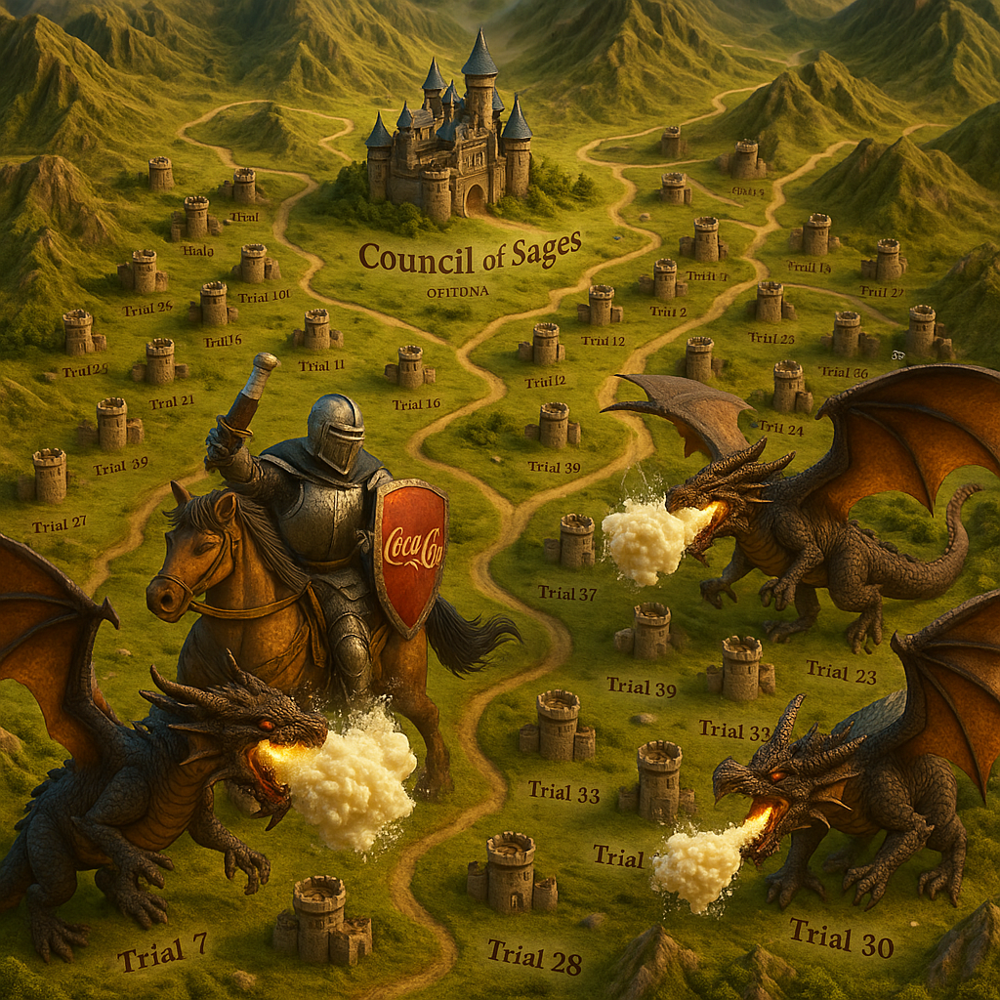

In [4]:
display(Image(filename="data/cola2.png"))

In [42]:
def objective(trial):
    random.seed(SEED)
    np.random.seed(SEED)
    torch.manual_seed(SEED)

    optimizer_name = trial.suggest_categorical("optimizer", ["Adam", "SGD", "RMSprop"])
    lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
    weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
    batch_size = trial.suggest_categorical("batch_size", [32, 64])
    dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
    n_epochs = trial.suggest_int("n_epochs", 3, 10)

    n_conv_layers = trial.suggest_int("n_conv_layers", 2, 3)
    conv_configs = []
    for i in range(n_conv_layers):
        k = trial.suggest_categorical(f"conv_kernel_{i}", [5, 7, 9])
        conv_configs.append(
            {
                "out_channels": trial.suggest_categorical(f"conv_out_{i}", [128, 256]),
                "kernel_size": k,
                "stride": 1,
                "padding": k // 2,
            }
        )

    n_fc_layers = trial.suggest_int("n_fc_layers", 1, 2)
    fc_hidden = [
        trial.suggest_categorical(f"fc_hidden_{i}", [64, 128])
        for i in range(n_fc_layers)
    ]

    model = GenomicCNNClassifier(
        seq_len=512,
        in_channels=5,
        num_classes=1,
        conv_configs=conv_configs,
        activation="ReLU",
        norm_type="batch",
        dropout=dropout,
        fc_hidden_dims=fc_hidden,
    ).to(device)

    optimizers = {
        "Adam": optim.Adam,
        "SGD": optim.SGD,
        "RMSprop": optim.RMSprop,
    }
    optimizer_cls = optimizers[optimizer_name]
    optimizer = optimizer_cls(model.parameters(), lr=lr, weight_decay=weight_decay)

    scheduler = None
    scheduler_name = trial.suggest_categorical("scheduler", ["StepLR", None])
    if scheduler_name == "StepLR":
        step_size = trial.suggest_int("step_size", 3, 7)
        gamma = trial.suggest_uniform("gamma", 0.2, 0.8)
        scheduler = optim.lr_scheduler.StepLR(
            optimizer, step_size=step_size, gamma=gamma
        )

    train_loader_batch = DataLoader(
        train_ds,
        batch_size=batch_size,
        shuffle=True,
        pin_memory=True,
        worker_init_fn=lambda wid: np.random.seed(SEED + wid)
        or random.seed(SEED + wid),
    )
    test_loader_batch = DataLoader(
        test_ds,
        batch_size=batch_size,
        shuffle=False,
        pin_memory=True,
        worker_init_fn=lambda wid: np.random.seed(SEED + wid)
        or random.seed(SEED + wid),
    )

    for epoch in range(1, n_epochs + 1):
        model.train()
        for X, y in train_loader_batch:
            X, y = X.to(device), y.to(device).float()
            optimizer.zero_grad()
            logits = model(X).squeeze(1)
            loss = nn.BCEWithLogitsLoss()(logits, y)
            loss.backward()
            optimizer.step()
        if scheduler:
            scheduler.step()

        model.eval()
        all_probs, all_labels = [], []
        with torch.no_grad():
            for X, y in test_loader_batch:
                X = X.to(device)
                y = y.to(device).float()
                logits = model(X).squeeze(1)
                probs = torch.sigmoid(logits).cpu().numpy()
                all_probs.extend(probs)
                all_labels.extend(y.cpu().numpy())

        preds = (np.array(all_probs) >= 0.5).astype(int)
        f1 = f1_score(all_labels, preds)
        trial.report(f1, epoch)
        if trial.should_prune():
            raise optuna.TrialPruned()

    return f1


pruner = optuna.pruners.MedianPruner(
    n_startup_trials=4, n_warmup_steps=2, interval_steps=1
)
study = optuna.create_study(direction="maximize", pruner=pruner)
study.optimize(objective, n_trials=n_trials, show_progress_bar=True)
wandb.log({"best_params": study.best_params})

[I 2025-06-19 20:04:24,624] A new study created in memory with name: no-name-c86a1279-ef90-455b-8ca4-931fa6fbaa6f


  0%|          | 0/15 [00:00<?, ?it/s]/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
Best trial: 0. Best value: 0.0878908:   7%|▋         | 1/15 [12:29<2:54:56, 74

[I 2025-06-19 20:16:54,353] Trial 0 finished with value: 0.08789084968824057 and parameters: {'optimizer': 'RMSprop', 'lr': 1.606614699525642e-05, 'weight_decay': 1.8148994678815617e-06, 'batch_size': 64, 'dropout': 0.17063336485882152, 'n_epochs': 10, 'n_conv_layers': 3, 'conv_kernel_0': 9, 'conv_out_0': 256, 'conv_kernel_1': 9, 'conv_out_1': 128, 'conv_kernel_2': 9, 'conv_out_2': 256, 'n_fc_layers': 1, 'fc_hidden_0': 128, 'scheduler': None}. Best is trial 0 with value: 0.08789084968824057.


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
Best trial: 1. Best value: 0.689353:  13%|█▎        | 2/15 [16:31<1:37:41, 450.90s/it] 

[I 2025-06-19 20:20:56,076] Trial 1 finished with value: 0.6893526920750151 and parameters: {'optimizer': 'SGD', 'lr': 0.00313309754174399, 'weight_decay': 0.004897022800976965, 'batch_size': 64, 'dropout': 0.2281662293788258, 'n_epochs': 6, 'n_conv_layers': 2, 'conv_kernel_0': 5, 'conv_out_0': 128, 'conv_kernel_1': 7, 'conv_out_1': 128, 'n_fc_layers': 1, 'fc_hidden_0': 64, 'scheduler': None}. Best is trial 1 with value: 0.6893526920750151.


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
/tmp/ipykernel_16181/693278018.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wil

[I 2025-06-19 20:26:23,457] Trial 2 finished with value: 0.6900228484386901 and parameters: {'optimizer': 'SGD', 'lr': 0.00482301438201836, 'weight_decay': 0.003496947907938462, 'batch_size': 64, 'dropout': 0.3587038645452685, 'n_epochs': 8, 'n_conv_layers': 2, 'conv_kernel_0': 7, 'conv_out_0': 128, 'conv_kernel_1': 9, 'conv_out_1': 128, 'n_fc_layers': 1, 'fc_hidden_0': 128, 'scheduler': 'StepLR', 'step_size': 3, 'gamma': 0.40339575747733913}. Best is trial 2 with value: 0.6900228484386901.


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
/tmp/ipykernel_16181/693278018.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wil

[I 2025-06-19 20:30:38,794] Trial 3 finished with value: 0.6707221962252379 and parameters: {'optimizer': 'Adam', 'lr': 0.0018531426091655495, 'weight_decay': 4.0227610585087244e-05, 'batch_size': 64, 'dropout': 0.29390144944320407, 'n_epochs': 3, 'n_conv_layers': 3, 'conv_kernel_0': 5, 'conv_out_0': 256, 'conv_kernel_1': 5, 'conv_out_1': 256, 'conv_kernel_2': 7, 'conv_out_2': 256, 'n_fc_layers': 1, 'fc_hidden_0': 128, 'scheduler': 'StepLR', 'step_size': 7, 'gamma': 0.5834927934350074}. Best is trial 2 with value: 0.6900228484386901.


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
Best trial: 2. Best value: 0.690023:  33%|███▎      | 5/15 [29:08<46:38, 279.87s/it]  

[I 2025-06-19 20:33:32,830] Trial 4 pruned. 


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
/tmp/ipykernel_16181/693278018.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wil

[I 2025-06-19 20:41:55,135] Trial 5 pruned. 


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
/tmp/ipykernel_16181/693278018.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wil

[I 2025-06-19 20:44:49,379] Trial 6 pruned. 


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
/tmp/ipykernel_16181/693278018.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wil

[I 2025-06-19 20:48:58,631] Trial 7 pruned. 


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
Best trial: 2. Best value: 0.690023:  60%|██████    | 9/15 [58:11<44:53, 448.87s/it]

[I 2025-06-19 21:02:35,995] Trial 8 finished with value: 0.6588310038119441 and parameters: {'optimizer': 'Adam', 'lr': 0.00257022371948686, 'weight_decay': 2.1227996060754942e-05, 'batch_size': 32, 'dropout': 0.35336386446911017, 'n_epochs': 10, 'n_conv_layers': 2, 'conv_kernel_0': 7, 'conv_out_0': 128, 'conv_kernel_1': 7, 'conv_out_1': 128, 'n_fc_layers': 1, 'fc_hidden_0': 128, 'scheduler': None}. Best is trial 2 with value: 0.6900228484386901.


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
Best trial: 2. Best value: 0.690023:  67%|██████▋   | 10/15 [1:01:11<30:29, 365.84s/it]

[I 2025-06-19 21:05:35,925] Trial 9 pruned. 


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
/tmp/ipykernel_16181/693278018.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wil

[I 2025-06-19 21:07:57,861] Trial 10 pruned. 


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
Best trial: 2. Best value: 0.690023:  80%|████████  | 12/15 [1:07:00<13:30, 270.01s/it]

[I 2025-06-19 21:11:25,417] Trial 11 finished with value: 0.6659299021155667 and parameters: {'optimizer': 'SGD', 'lr': 0.007935710774382456, 'weight_decay': 0.008740685223673429, 'batch_size': 64, 'dropout': 0.27938239525921243, 'n_epochs': 5, 'n_conv_layers': 2, 'conv_kernel_0': 5, 'conv_out_0': 128, 'conv_kernel_1': 7, 'conv_out_1': 128, 'n_fc_layers': 1, 'fc_hidden_0': 64, 'scheduler': None}. Best is trial 2 with value: 0.6900228484386901.


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
Best trial: 2. Best value: 0.690023:  87%|████████▋ | 13/15 [1:09:03<07:30, 225.31s/it]

[I 2025-06-19 21:13:27,875] Trial 12 pruned. 


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
/tmp/ipykernel_16181/693278018.py:55: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wil

[I 2025-06-19 21:15:30,314] Trial 13 pruned. 


/tmp/ipykernel_16181/693278018.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform("lr", 1e-5, 1e-2)
/tmp/ipykernel_16181/693278018.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform("weight_decay", 1e-6, 1e-2)
/tmp/ipykernel_16181/693278018.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout = trial.suggest_uniform("dropout", 0.1, 0.5)
Best trial: 2. Best value: 0.690023: 100%|██████████| 15/15 [1:12:37<00:00, 290.49s/it]

[I 2025-06-19 21:17:01,914] Trial 14 pruned. 


In [ ]:
with open("optuna_study.pkl", "wb") as f:
    pickle.dump(study, f, protocol=pickle.HIGHEST_PROTOCOL)

In [22]:
with open("optuna_study.pkl", "rb") as f:
    study = pickle.load(f)

In [23]:
study.best_params

{'optimizer': 'SGD',
 'lr': 0.00482301438201836,
 'weight_decay': 0.003496947907938462,
 'batch_size': 64,
 'dropout': 0.3587038645452685,
 'n_epochs': 8,
 'n_conv_layers': 2,
 'conv_kernel_0': 7,
 'conv_out_0': 128,
 'conv_kernel_1': 9,
 'conv_out_1': 128,
 'n_fc_layers': 1,
 'fc_hidden_0': 128,
 'scheduler': 'StepLR',
 'step_size': 3,
 'gamma': 0.40339575747733913}

In [24]:
def _worker_init(wid):
    np.random.seed(SEED + wid)
    random.seed(SEED + wid)

In [25]:
best_params = study.best_params
n_epochs = best_params.get("n_epochs", 10)
batch_size = best_params["batch_size"]

train_loader = DataLoader(
    train_ds,
    batch_size=batch_size,
    shuffle=True,
    pin_memory=True,
    worker_init_fn=_worker_init,
)
test_loader = DataLoader(
    test_ds,
    batch_size=batch_size,
    shuffle=False,
    pin_memory=True,
    worker_init_fn=_worker_init,
)

conv_configs = []
for i in range(best_params["n_conv_layers"]):
    k = best_params[f"conv_kernel_{i}"]
    conv_configs.append(
        {
            "out_channels": best_params[f"conv_out_{i}"],
            "kernel_size": k,
            "stride": 1,
            "padding": k // 2,
        }
    )
fc_hidden_dims = [
    best_params[f"fc_hidden_{i}"] for i in range(best_params["n_fc_layers"])
]

model = GenomicCNNClassifier(
    seq_len=512,
    in_channels=5,
    num_classes=1,
    conv_configs=conv_configs,
    activation="ReLU",
    norm_type="batch",
    dropout=best_params["dropout"],
    fc_hidden_dims=fc_hidden_dims,
).to(device)

criterion = nn.BCEWithLogitsLoss()
opt_cls = {"Adam": optim.Adam, "SGD": optim.SGD, "RMSprop": optim.RMSprop}[
    best_params["optimizer"]
]
optimizer = opt_cls(
    model.parameters(),
    lr=best_params["lr"],
    weight_decay=best_params["weight_decay"],
)
if best_params.get("scheduler") == "StepLR":
    scheduler = optim.lr_scheduler.StepLR(
        optimizer,
        step_size=best_params.get("step_size", 5),
        gamma=best_params.get("gamma", 0.5),
    )
else:
    scheduler = None

In [ ]:
wandb.init(project="genomics-cnn-final", config={**best_params, "epochs": n_epochs})
wandb.watch(model, log="all", log_freq=50)

best_f1 = 0.0
for epoch in range(1, n_epochs + 1):
    random.seed(SEED + epoch)
    np.random.seed(SEED + epoch)
    torch.manual_seed(SEED + epoch)

    model.train()
    total_train_loss = 0.0
    train_probs, train_labels = [], []

    for X, y in train_loader:
        X, y = X.to(device), y.to(device).float()
        optimizer.zero_grad()
        logits = model(X).squeeze(1)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()

        total_train_loss += loss.item() * X.size(0)
        probs = torch.sigmoid(logits).detach().cpu().numpy()
        train_probs.extend(probs)
        train_labels.extend(y.cpu().numpy())

    if scheduler is not None:
        scheduler.step()

    avg_train_loss = total_train_loss / len(train_loader.dataset)

    model.eval()
    total_test_loss = 0.0
    test_probs, test_labels = [], []

    with torch.no_grad():
        for X, y in test_loader:
            X, y = X.to(device), y.to(device).float()
            logits = model(X).squeeze(1)
            loss = criterion(logits, y)
            total_test_loss += loss.item() * X.size(0)

            probs = torch.sigmoid(logits).cpu().numpy()
            test_probs.extend(probs)
            test_labels.extend(y.cpu().numpy())

    avg_test_loss = total_test_loss / len(test_loader.dataset)
    train_pred = (np.array(train_probs) >= 0.5).astype(int)
    test_pred = (np.array(test_probs) >= 0.5).astype(int)

    metrics = {
        "epoch": epoch,
        "train/loss": avg_train_loss,
        "train/accuracy": accuracy_score(train_labels, train_pred),
        "train/precision": precision_score(train_labels, train_pred),
        "train/recall": recall_score(train_labels, train_pred),
        "train/f1": f1_score(train_labels, train_pred),
        "train/auc": roc_auc_score(train_labels, train_probs),
        "test/loss": avg_test_loss,
        "test/accuracy": accuracy_score(test_labels, test_pred),
        "test/precision": precision_score(test_labels, test_pred),
        "test/recall": recall_score(test_labels, test_pred),
        "test/f1": f1_score(test_labels, test_pred),
        "test/auc": roc_auc_score(test_labels, test_probs),
        "lr": optimizer.param_groups[0]["lr"],
    }

    wandb.log(metrics, step=epoch)
    print(f"Epoch {epoch}/{n_epochs} — LR: {metrics['lr']:.2e}")
    print("Train loss: {metrics['train/loss']:.4f}  |  Test loss: {metrics['test/loss']:.4f}")
    print(f"Train F1: {metrics['train/f1']:.4f}  |  Test F1: {metrics['test/f1']:.4f}\n")

    if metrics["test/f1"] > best_f1:
        best_f1 = metrics["test/f1"]
        torch.save(model.state_dict(), "best_model_f1_final.pth")
        print(f"New best F1: {best_f1:.4f}, checkpoint saved\n")

wandb: Finishing previous runs because reinit is set to 'default'.
wandb: uploading wandb-summary.json; uploading config.yaml
wandb:                                                                                
wandb: 🚀 View run wild-plasma-1 at: https://wandb.ai/romanbokhyan-hse-university/genomics-cnn-final/runs/8c4vo95w
wandb: ⭐️ View project at: https://wandb.ai/romanbokhyan-hse-university/genomics-cnn-final
wandb: Synced 5 W&B file(s), 0 media file(s), 0 artifact file(s) and 0 other file(s)
wandb: Find logs at: ./wandb/run-20250619_213640-8c4vo95w/logs
wandb: Tracking run with wandb version 0.20.1
wandb: Run data is saved locally in /home/jupyter/work/resources/DLNaturalScience/Biology/wandb/run-20250619_213727-iknnoi8s
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run classic-lake-2
wandb: ⭐️ View project at https://wandb.ai/romanbokhyan-hse-university/genomics-cnn-final
wandb: 🚀 View run at https://wandb.ai/romanbokhyan-hse-university/genomics-cnn-final/runs/i

Epoch 1/8 — LR: 4.82e-03
  Train loss: 0.1076  |  Test loss: 0.0777
  Train F1: 0.5946  |  Test F1: 0.6604

New best F1: 0.6604, checkpoint saved

Epoch 2/8 — LR: 4.82e-03
  Train loss: 0.0936  |  Test loss: 0.0747
  Train F1: 0.6537  |  Test F1: 0.6810

New best F1: 0.6810, checkpoint saved

Epoch 3/8 — LR: 1.95e-03
  Train loss: 0.0903  |  Test loss: 0.0739
  Train F1: 0.6614  |  Test F1: 0.6850

New best F1: 0.6850, checkpoint saved

Epoch 4/8 — LR: 1.95e-03
  Train loss: 0.0869  |  Test loss: 0.0739
  Train F1: 0.6686  |  Test F1: 0.6816

Epoch 5/8 — LR: 1.95e-03
  Train loss: 0.0858  |  Test loss: 0.0734
  Train F1: 0.6736  |  Test F1: 0.6834

Epoch 6/8 — LR: 7.85e-04
  Train loss: 0.0844  |  Test loss: 0.0739
  Train F1: 0.6773  |  Test F1: 0.6742

Epoch 7/8 — LR: 7.85e-04
  Train loss: 0.0822  |  Test loss: 0.0733
  Train F1: 0.6821  |  Test F1: 0.6873

New best F1: 0.6873, checkpoint saved

Epoch 8/8 — LR: 7.85e-04
  Train loss: 0.0815  |  Test loss: 0.0729
  Train F1: 0.6824  

In [54]:
import optuna.visualization as vis

fig1 = vis.plot_optimization_history(study)
fig2 = vis.plot_param_importances(study)

fig1.show()
fig2.show()

Короче как можно заметить я опутной подбирал буквально все что подбирается cамыми разными способами. Итогом оптуны стала метрика f1(я смотрю на нее тк дисбаланс) 0.69, но не совсем. Я получил тем же кодом и прочими настройками что то около 0.72(ну то есть тоже самое почти что и на обычном обучении) на своем компе, но он у меня благополучно завис и мне пришлось реранить все на датасфере и еще докинуть сид, который я забыл изначально. Ну а при реране вышли такие метрики (ставлю на так называемую случайность инициализации ибо отличие очень маленькое которое не несет значимой разницы в результативности), в любом случае энивей подбор оптуной прошел успешно, так как все метрики превзошли мои ожидания от архитектуры на такой задач, они на равне с топ решениями, поэтому иду дальше заниматься интерпретацией, а по этой части можно смело сказать что я сделал все что можно и вышло круто.

## Этап 6. Расшифровка Древних Руин (Интерпретация модели с помощью XAI)

> **Количество баллов: 20**

Ваша нейронная армия достигла совершенства, но истинные рыцари не останавливаются на достигнутом! Теперь вам предстоит расшифровать тайные письмена, которые ваша модель использует для принятия решений. Спуститесь в древние руины генома и раскройте секреты его регуляции с помощью магии интерпретации!

**Ваша миссия:** Использовать минимум 3 метода XAI для раскрытия биологических механизмов, которые ваша модель научилась распознавать в ДНК.

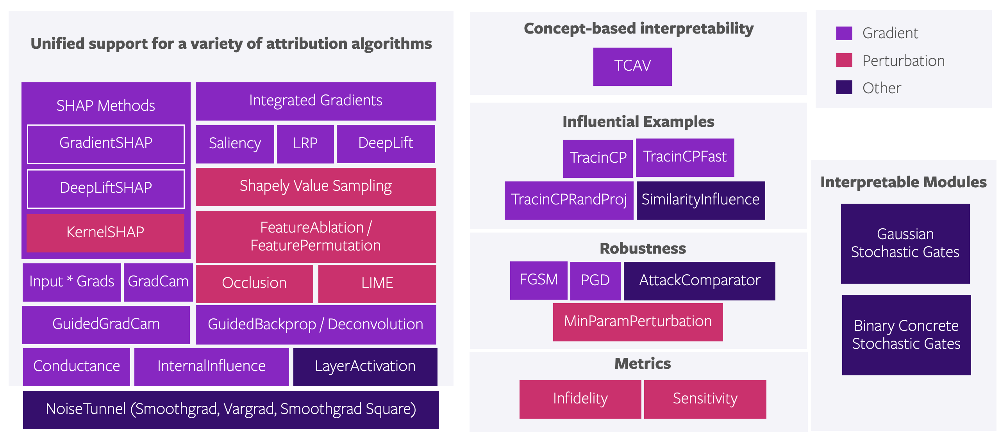

**Действия:**

1. Выбор магических инструментов (Методы интерпретации)

> * Изучите методы из библиотеки [Captum](https://captum.ai/). Также, обратитесь к [гитхабу библиотеки](https://github.com/pytorch/captum)
> * Выберите **3 метода интерпретации**. Попробуйте выбирать методы разных подходов расчета. 
> * Расскажите про выбранные методы: как они считают релевантность, какие формулы используются, в чем их особенность. Приводите примеры использованияэтого метода в научных статьях:
>   * *First XAI method*: 

$$
\mathrm{IG}_i(x) = (x_i - x'_i)\;\int_{0}^{1} \frac{\partial F\bigl(x' + \alpha\,(x - x')\bigr)}{\partial x_i}\,d\alpha
$$

* **$x$** — входной вектор .
* **$x'$** — «базовый» вход (например, нулевой вектор).
* **$F$** — скалярная выходная функция модели (логит или вероятность).
* **$\alpha\in[0,1]$** — параметр интерполяции от $x'$ к $x$.


Integrated Gradients - метод интерпретации который считается путем интегрирования градиенты логита начиная с нуля закачнивая реальными значениям. По итогу он дает авг сумму производных и это аля стабилизирует градиент. Таким образом это просто интеграл который численно приближали разбиением от 1 до 1 на m шагов и суммировали. Особенности метода заключаются в том что он ниче не сглаживает (градиент), а просто атрибуция входа + он довольно математически простой и теор доказыный, так что можно верить что идейно это ок. А пример из статьи, то есть статья где модель deepsea обучали на датасет TF-сайты и там юзанули IG и он выявил биологически значимые нуклеотиды, вот название статьи  Sequential regulatory activity prediction across chromosomes with convolutional neural networks.

$$
\mathrm{IG}_i(x) = (x_i - x'_i)\;\int_{0}^{1} \frac{\partial F\bigl(x' + \alpha\,(x - x')\bigr)}{\partial x_i}\,d\alpha
$$

* **$x$** — входной вектор (one-hot-нульки в нашей задаче).
* **$x'$** — «базовый» вход (например, нулевой вектор).
* **$F$** — скалярная выходная функция модели (логит или вероятность).
* **$\alpha\in[0,1]$** — параметр интерполяции от $x'$ к $x$.



>   * *Second XAI method*: 
DeepLIFT - этот метод считает вклад каждого нейрона через неприрывную разницу активаций относительно базового состояния, из особенностей он обрабатывает знак изменений т е хорошо передает отрицательные вклады (то есть отрицательное значение которое отвечает за негативный вклад в предсказание) плюс быстрый. Learning Important Features Through Propagating Activation Differences в этой статье использовали диплифт на cnn и выявили что архитектура из статьи лучше выявляет короткие мотивы транскрипционных факторов в сравнении с saliency map 

$$
C_{i} = \Delta x_i \;\times\; \frac{\Delta y}{\sum_{j}\Delta x_j},
\qquad
\Delta x_i = x_i - x'_i,\quad 
\Delta y = F(x) - F(x')
$$

* **$\Delta x_i$** — отличие $i$-го входа от базового.
* **$\Delta y$** — изменение выхода модели между $x$ и $x'$.
* **$C_i$** — вклад $i$-го входа в изменение выхода.




>   * *Third XAI method*: 
tbh мой самый нелюбимый метод SHAP - шап основанный на теории игр (официальная теория справедливого распределения заслуг), он проводит несколько раз прямые и обратные проходы по графу с добавлением шума к входу и вычисляет градиент. из особенностей он усиливает оч сильно атрибуции за счет сглажиивания по шуму + вот эта идея с распределением заслуг (отсюда и название SHAP) реально применина в случае xAI ибо при достаточном числе шумовых семлоф приближает реал распределение вклада, но не стоит забывать что его очень дорого считать из за того что мы часто интегрируем и проходим туда сюда по графу. Из статей Choi et al. (2020) юзали шап для моделей которые предсказыали эпигенетические маркеры, где как раз идея со сглаживанием шума помог в задаче найти реальные мотивы. 

$$
\mathrm{GS}_i(x) = \frac{1}{S}\sum_{s=1}^{S} \int_{0}^{1}
\frac{\partial F\bigl(x' + \alpha\,(x + \eta_s - x')\bigr)}{\partial x_i}\,d\alpha
$$

* **$S$** — число шумовых сэмплов.
* **$\eta_s$** — случайный шум (обычно нормальный или равномерный).
* **$x'$** — базовый вход.
* Остальные переменные как в Integrated Gradients.

>   * *4 XAI method*: 
Ну и нельзя не упомянуть базу Input x Gradient - он умножает градиенты на вход и так получает меру релевантности каждого признака, звучит просто, но у него тоже есть особенности: довольно локальный то есть он понимает важность вокруг , требует лишь 1 бекпропа, ну и так же математически обоснован. Из статей Ancona et al. “Towards better understanding of gradient-based attribution methods” сранивают методы интерпретации на разных задачах и там приходят к мнению что IG и этот методы частенько похожи по резам, но InputXGrad быстрее


$$
R_i(x) \;=\; x_i \;\times\; \frac{\partial f(x)}{\partial x_i}
$$

**Где:**

* $x = (x_1, \dots, x_d)$ — входной вектор признаков.
* $f(x)$ — скалярный выход модели (логит положительного класса).
* $\displaystyle \frac{\partial f(x)}{\partial x_i}$ — градиент функции $f$ по признаку $x_i$, измеряющий чувствительность выхода к малым изменениям $x_i$.
* $R_i(x)$ — «релевантность» или атрибуция признака $i$: высокое значение означает, что изменение $x_i$ сильно влияет на предсказание.


----
короче оверол по трем методам они все делают одно, но по разному и очень применимы в области биоинфы, так как нам мало смотреть на метрики надо же понять как модель принимает то или иное решенеи, а методы интерпретации как раз с этим помогут!



> * При желании, можно уточнить в чате курса о других библиотеках для интерпретации, если вы захотите воспользоваться не только captum.
> * **Важно!** Некоторые методы подразумевают наличие отрицательных значений важности. Проверьте, подразумевают ли выбранные вами методы отрицательные значения и что они означают. В дальнейшем, вы будете усреднять стат. метрики среди трех методов - следите, чтобы минусы не нарушали логику ваших вычислений. К примеру, если отрицательные значения важности в методе показывают отрицательнюу корреляцию между положительным таргетом и данным признаком, то признак, скорее всего, не будет ассоциироваться с регионами вашей биологической задачи.

2. **Получение нуклеотидной важности:**
> * Примените каждый из 3 методов к лучшей (оптимизированной через Optuna) модели на каждом тестовом True Positive объекте, поставив в качестве таргета единицу. Если модель обучилась плохо и вы ничего не можете сделать, выбирайте обучающую выборку (и никогда так не делайте в научных исследованиях).
> * Для каждого такого тестового примера получите матрицу важности размером `L × 4` (L - длина последовательности, 4 - кол-во нуклеотидов)
> * Преобразуйте в вектор важности длины L (например, максимум по 4 нуклеотидным каналам). **Обоснуйте выбор агрегации по числу каналов.** 

-----------------------
потому что при ванхгот кодировании на каждой позиции активен только один канал остальные три равны нулю и агрегировать по каналам нужно чтобы свести матрицу 4×L к вектору длины L и получить важность именно активного нуклеотида без искажений и лишнего шума
-----------------------


2. **Агрегация в k-меры:**
> * Разбейте последовательности на перекрывающиеся k-меры длины `k` (параметр, выберите 3≤k≤7)
> * Для каждого k-мера вычислите агрегированную важность в конкретном объекте:
>    $$
     I_{\text{kmer}} = \text{агрегатор}(I_{\text{pos}}, I_{\text{pos} + 1},..., I_{\text{pos} + k - 1})
    $$
> * Варианты агрегаторов. **Реализуйте два варианта агрегации:**
>     * **Mean:** `(I_i + ... + I_i+k-1)/k`
>     * **Max:** `max(I_i, ..., I_i+k-1)`
>     * **Geometric mean:** `(Π(I_j + ε))^(1/k)` 
>     * **Sum:** `ΣI_j`

3. **Ранжирование k-меров:**
> * Для каждого метода интерпретации \( $m \in \{ \text{xai}_1, \text{xai}_2, \text{xai}_3 \}$ \):
>  * Рассчитайте среднюю важность каждого уникального k-мера по всем тестовым True Positive объектам:
>
>     $$
     \mu_m(\text{kmer}) = \frac{1}{N} \sum_{n=1}^{N} I_{\text{kmer},n}^{(m)}
     $$
>
>     где:
>     - \( N \) - количество тестовых True Positive объектов
>     - \( $I_{\text{kmer},n}^{(m)} $\) - важность k-мера в объекте \( n \) согласно методу \( m \)
> 
>  * Вычислите Percent Mean Deviation (PMD) для каждого k-мера относительно данного метода интерпретации:
>     $$
     \text{PMD}_m(\text{kmer}) = \frac{1}{N} \sum_{n=1}^{N} \frac{ | I_{\text{kmer},n}^{(m)} - \mu_m(\text{kmer}) | }{\mu_m(\text{kmer})} \times 100\%
     $$
> * Вы получите по три оценки (от каждого метода интерпретации) на каждый уникальный k-мер.

4. **Финальный анализ:**
> * Усредните PMD по трем методам:
>   $$
   \text{PMD}_{\text{avg}}(\text{kmer}) = \frac{1}{3} \left( \text{PMD}_{\text{xai}_1}(\text{kmer}) + \text{PMD}_{\text{xai}_2}(\text{kmer}) + \text{PMD}_{\text{xai}_3}(\text{kmer}) \right)
   $$
> * Проранжируйте k-меры по убыванию $PMD_{avg}$
> * Составьте ТОП-10 наиболее важных k-меров


5. Интерпретация результатов
> * Сравните полученные k-меры с известными биологическими мотивами для вашего биологической задачи
> * Проанализируйте различия в результатах разных методов интерпретации

**Критерии оценки:**
- Корректность запуска методов интерпретации
- Обоснованный выбор параметра k и методов агрегации
- Правильность расчетов PMD и ранжирования
- Глубина биологического анализа результатов
- Ответы на теоретические вопросы
- Красота картинки в самом важном

**Самое важное**

> Создайте нейросетью изображение "Древние руины с загадочными символами ДНК, освещенные тремя лучами разных цветов (символизирующие три метода интерпретации)".
>```python
> # Место для создания изображения с помощью нейросети
> # Промпт: "Ancient ruins with mysterious DNA symbols illuminated by three beams of different colors, digital art"
> ```
> "Истинный рыцарь не только побеждает, но и понимает природу своей победы. Пусть свет интерпретации озарит ваше понимание генома!"*

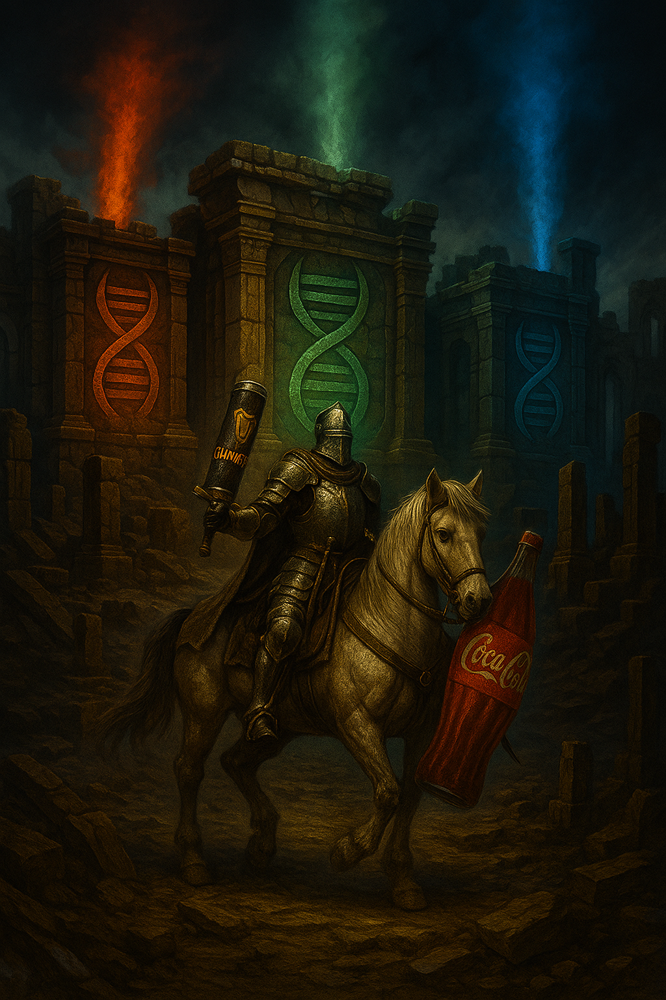

In [3]:
display(Image(filename="data/cola.png"))

In [2]:
%pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.8/15.8 MB 12.2 MB/s eta 0:00:00a 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 1.6 MB/s eta 0:00:00eta 0:00:01
  Created wheel for numpy: filename=numpy-1.26.4-cp313-cp313-macosx_15_0_arm64.whl size=4680085 sha256=f70770aa89b19fc03d599bca188789d64e744f1a19a77de620587c6044478a10
  Stored in directory: /Users/roman/Library/Caches/pip/wheels/8b/2d/9f/b6b46373f328e2ef50388915d351ccacbedac929459b5459bf
Successfully built numpy
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.5
    Uninstalling numpy-2.2.5:
      Successfully uninstalled numpy-2.2.5
Note: you may need to restart the kernel to use updated packages.


In [26]:
# здесь много разных функций подсчета и агрегирований
checkpoint = torch.load("best_model_f1_final.pth", map_location=device)
model.load_state_dict(checkpoint)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device).eval()

GenomicCNNClassifier(
  (conv_blocks): ModuleList(
    (0): Sequential(
      (0): Conv1d(5, 128, kernel_size=(7,), stride=(1,), padding=(3,))
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout(p=0.3587038645452685, inplace=False)
    )
    (1): Sequential(
      (0): Conv1d(128, 128, kernel_size=(9,), stride=(1,), padding=(4,))
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout(p=0.3587038645452685, inplace=False)
    )
  )
  (fc): Sequential(
    (0): Linear(in_features=65536, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.3587038645452685, inplace=False)
    (4): Linear(in_features=128, out_features=1, bias=True)
  )
)

In [ ]:
dataset_size = len(test_ds)
subset_size = int(0.2 * dataset_size) # возьму часть датасета ибо для интерпретации тп можно обойтись и так, чтобы комп не взорвался
rng = np.random.RandomState(SEED)
subset_indices = rng.choice(dataset_size, size=subset_size, replace=False)
subset = Subset(test_ds, subset_indices)
loader = DataLoader(subset, batch_size=1, shuffle=False)

In [53]:
tp_indices = []
for idx in subset_indices:
    x, y = test_ds[idx]
    x = x.to(device).unsqueeze(0)
    with torch.no_grad():
        logits = model(x).squeeze(1)
        pred = (torch.sigmoid(logits) >= 0.5).int().item()
    if pred == 1 and y.item() == 1:
        tp_indices.append(idx)

if not tp_indices:
    raise RuntimeError("check dataset")

In [54]:
tp_indices = []
for idx in subset_indices:
    x, y = test_ds[idx]
    x = x.to(device).unsqueeze(0)
    with torch.no_grad():
        logits = model(x).squeeze(1)
        pred = (torch.sigmoid(logits) >= 0.5).int().item()
    if pred == 1 and y.item() == 1:
        tp_indices.append(idx)
if not tp_indices:
    raise RuntimeError("check dataset")

In [55]:
tp_inputs = [(test_ds.clean_seqs[i], test_ds.encoded[i]) for i in tp_indices]

ig = IntegratedGradients(model)
ixg = InputXGradient(model)
gs = GradientShap(model)
methods = {"IG": ig, "InputXGradient": ixg, "SHAP": gs}
k = 5

In [ ]:
def get_attribution(inp_tensor, method):
    inp = inp_tensor.unsqueeze(0).to(device)
    target = 0
    if method is gs:
        C, L = inp.shape[1], inp.shape[2]
        baseline_dist = torch.zeros((10, C, L), device=device)
        attr = gs.attribute(
            inp, n_samples=50, stdevs=1e-3, baselines=baseline_dist, target=target
        )
    else:
        attr = method.attribute(inp, target=target)
    attr_np = attr.squeeze(0).cpu().detach().numpy()  
    agg_max = np.max(attr_np, axis=0)
    agg_mean = np.mean(attr_np, axis=0)
    return attr_np.T, {"max": agg_max, "mean": agg_mean}

importance_vectors = {m: [] for m in methods}
for seq, tensor in tp_inputs:
    for name, method in methods.items():
        _, agg = get_attribution(tensor, method)
        importance_vectors[name].append((seq, agg))

/home/jupyter/.local/lib/python3.10/site-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/home/jupyter/.local/lib/python3.10/site-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/home/jupyter/.local/lib/python3.10/site-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/home/jupyter/.local/lib/python3.10/site-packages/captum/attr/_core/input_x_gradient.py:118: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_

In [57]:
from collections import defaultdict

aggregators = {
    "mean": lambda x: np.mean(x),
    "max": lambda x: np.max(x),
    "geom_mean": lambda x: np.prod(x + 1e-6) ** (1.0 / len(x)),
    "sum": lambda x: np.sum(x),
}
kmer_vals = {m: defaultdict(list) for m in methods}
for m in methods:
    for seq, agg_dict in importance_vectors[m]:
        for name, vec in agg_dict.items():
            L = len(vec)
            for i in range(L - k + 1):
                kmer = seq[i : i + k]
                window = vec[i : i + k]
                for agg_name, agg_func in aggregators.items():
                    kmer_vals[m][(kmer, agg_name)].append(agg_func(window))

/tmp/ipykernel_22029/375043617.py:6: RuntimeWarning: invalid value encountered in power
  "geom_mean": lambda x: np.prod(x + 1e-6) ** (1.0 / len(x)),


In [58]:
pmd = {m: {} for m in methods}
for m in methods:
    for key, vals in kmer_vals[m].items():
        mu = np.mean(vals)
        pmd[m][key] = np.mean([abs(v - mu) / mu for v in vals]) * 100

In [59]:
avg_pmd = {}
for key in next(iter(pmd.values())).keys():
    avg_pmd[key] = np.mean([pmd[m][key] for m in methods])

In [61]:
print("Average PMD per aggregator (averaged across all methods):")
for agg in aggregators.keys():
    scores = [score for (kmer, a), score in avg_pmd.items() if a == agg]
    mean_score = np.mean(scores) if scores else float("nan")
    print(f"{agg}: {mean_score:.2f}%")

Average PMD per aggregator (averaged across all methods):
mean: 98.61%
max: 75.44%
geom_mean: nan%
sum: 98.61%


In [62]:
for m in methods:
    print(f"\n=== Method: {m} ===")
    for agg in aggregators.keys():
        method_scores = [v for (kmer, a), v in pmd[m].items() if a == agg]
        mean_m = np.mean(method_scores) if method_scores else float("nan")
        print(f"{agg} average PMD: {mean_m:.2f}%")
        top_k = sorted(
            [(kmer, v) for (kmer, a), v in pmd[m].items() if a == agg],
            key=lambda x: x[1],
            reverse=True,
        )[:10]
        print(f"Top-10 k-mers for {agg} in {m}:")
        for kmer, sc in top_k:
            print(f"  {kmer}: {sc:.2f}%")


=== Method: IG ===
mean average PMD: 106.75%
Top-10 k-mers for mean in IG:
  ATGTG: 4483.99%
  CATGA: 958.47%
  ATGAT: 780.12%
  CCATG: 750.65%
  TCATG: 599.01%
  TGATG: 496.02%
  ATGGT: 407.54%
  CATGT: 400.61%
  ACATG: 393.26%
  ATATA: 340.09%
max average PMD: 74.71%
Top-10 k-mers for max in IG:
  CATGA: 108.13%
  ATGTG: 103.98%
  ATGAT: 103.67%
  CATGG: 103.21%
  AATAT: 97.91%
  ATAGA: 95.85%
  GATGA: 95.52%
  CCATG: 94.73%
  TCATG: 93.36%
  CATGT: 92.12%
geom_mean average PMD: nan%
Top-10 k-mers for geom_mean in IG:
  AAGGA: nan%
  AGGAG: nan%
  GGAGA: nan%
  GAGAC: nan%
  AGACG: nan%
  GACGC: nan%
  ACGCT: nan%
  CGCTG: nan%
  GCTGC: nan%
  CTGCC: nan%
sum average PMD: 106.75%
Top-10 k-mers for sum in IG:
  ATGTG: 4483.99%
  CATGA: 958.47%
  ATGAT: 780.12%
  CCATG: 750.65%
  TCATG: 599.01%
  TGATG: 496.02%
  ATGGT: 407.54%
  CATGT: 400.61%
  ACATG: 393.26%
  ATATA: 340.09%

=== Method: InputXGradient ===
mean average PMD: 84.61%
Top-10 k-mers for mean in InputXGradient:
  ATGTG: 

In [ ]:
avg_pmd_per_agg = {}
for agg in ["max", "mean"]:
    avg = {}
    kmers = {key[0] for key in next(iter(pmd.values())).keys() if key[1] == agg}
    for kmer in kmers:
        vals = [pmd[m][(kmer, agg)] for m in methods]
        avg[kmer] = np.mean(vals)
    print(f"Top-10 k-mers by average PMD across methods for aggregator '{agg}':")
    for kmer, score in sorted(avg.items(), key=lambda x: x[1], reverse=True)[:10]:
        print(f"{kmer}: {score:.2f}%")
    print()

Top-10 k-mers by average PMD across methods for aggregator 'max':
CATGG: 119.23%
CATGA: 107.63%
CCATG: 106.86%
ATGTG: 102.00%
CACCA: 101.14%
ATGAT: 100.63%
CATCA: 98.21%
CATGT: 97.15%
CACAT: 97.10%
TGATG: 95.97%

Top-10 k-mers by average PMD across methods for aggregator 'mean':
ATGTG: 5177.31%
CACTG: 2123.50%
TGGTG: 1928.44%
CCCTG: 1815.60%
ATCAT: 1411.75%
ATGAT: 837.28%
ACCAT: 710.92%
TGTGG: 594.28%
CATTG: 544.41%
CACCT: 440.22%



In [ ]:
for agg in ["max", "mean"]:
    print(f"=== Per-method Top-10 k-mers for aggregator '{agg}' ===")
    for m in methods:
        method_scores = {kmer: pmd[m][(kmer, agg)] for (kmer, name) in pmd[m].keys() if name == agg}
        print(f"\nMethod: {m}")
        for kmer, score in sorted(
            method_scores.items(), key=lambda x: x[1], reverse=True
        )[:10]:
            print(f"{kmer}: {score:.2f}%")

=== Per-method Top-10 k-mers for aggregator 'max' ===

Method: IG
  CATGA: 108.13%
  ATGTG: 103.98%
  ATGAT: 103.67%
  CATGG: 103.21%
  AATAT: 97.91%
  ATAGA: 95.85%
  GATGA: 95.52%
  CCATG: 94.73%
  TCATG: 93.36%
  CATGT: 92.12%

Method: InputXGradient
  CATGG: 151.93%
  CCATG: 128.95%
  CACCA: 126.63%
  CACAT: 116.08%
  CATCA: 115.54%
  CATGT: 111.86%
  CACAC: 111.80%
  TGATG: 108.37%
  CATGA: 107.47%
  CCTGG: 107.27%

Method: SHAP
  CATGA: 107.30%
  ATGAT: 103.00%
  CATGG: 102.55%
  ATGTG: 100.26%
  AATAT: 99.69%
  CCATG: 96.90%
  GATGA: 94.74%
  TCATG: 94.47%
  ATAGA: 93.28%
  CATTG: 91.22%
=== Per-method Top-10 k-mers for aggregator 'mean' ===

Method: IG
  ATGTG: 4483.99%
  CATGA: 958.47%
  ATGAT: 780.12%
  CCATG: 750.65%
  TCATG: 599.01%
  TGATG: 496.02%
  ATGGT: 407.54%
  CATGT: 400.61%
  ACATG: 393.26%
  ATATA: 340.09%

Method: InputXGradient
  ATGTG: 7792.03%
  CACTG: 6096.10%
  TGGTG: 5410.89%
  CCCTG: 5233.95%
  ATCAT: 3599.89%
  ACCAT: 1682.42%
  TGTGG: 1369.82%
  ATGAT: 1

Так ну я понимаю, что тут много кода и разных резов, но если идейно все очев что я делал (я просто вывел все варианты возможные агрегаций и что просилось в задании). Но надо проанализиовать результаты сравнив их с биологической правдой.

У меня задача классификации промотеров и там я ожидал увидеть формирование пар A<->T и GC мотивы, в целом это  часто встречаемые основания которые связаны с промотерами (ну это факт), но понятно не фулл идеальное совпадение тк модель все же выучилась не на cамые высокие метрики из возможных.

Начну с **сравнение с известными мотивами** ATATA (формирования нуклеотидов Т <-> A) дейсвтительно часто встречаются для mean/max агрегации в методам IG И SHAP, реже встречается ATA (тоже отрывок тн  ТАТА бокса). GC мотивы встречаются реже, но они бывают и как пример даже выдали некоторые очень большой скор (подозреваю они встретились мало но очень сильно повлияли на решение классификации). Таким образом интерпретации больше всего показала ассоцаиацию с TATA частью мотивов (ATATA, ATGTG, TGATG и тд) и чуть реже комбинации GC (чаше встречались тн бактериальные мотивы TTGACA, которые связаны тоже с промотерами по типу CATGA). Тем не менее резы полностью укладываются в биологическую правду, конечно могло быть куда лучше и более наглядно, но тут уже вопрос в том как обучилась модель (модель обучилась хорошо и выдала хорошие резы, просто какой нибудь днк трансформер тут показал бы сильно лучше).

А теперь **сравню методы интерпретации**, можно заметить что mean часто дает очень высокую  метрику разброса пмд в целом у всех методов, например inputxgradient показал 7800% у ATGTG (забавно кстати, мне кажется раз модель ну не идеальная она могла выучить зависимость мол AT часто видим - круто! гуанин тоже часто встречается в правильных ответах и тут такой кандидат ATGTG, ну он точно признак промотера). а max более сдержанный, в пределах 90-150 процентов. у ig и  shap похожие кмеры по типу ATGTG, а вот inputxgradient на их фоне выделяется тем что иногда дает уникальные значения по типу CACTG, смею предположить это связано с тем что inputxgradient более склонен к шумы из за простоты реализации и поэтому он выделяет всякие экстрим значения. но есть кмеры которые стабильно у трех методов это ATGAT например.

Резюмируя, интепретация прошла очень хорошо учитывая метрики качества и реально есть результаты которые полностью удольтворяют биологической значимисоти кмер связанных с промотерам, а каждый метод раскрыл себя показав порой что то свое. 

Хочу подытожить свои результаты - я сделал все задания следуя условию и даже иногда добавляя свое и на итоге у меня вышло

1. моя архитектура превосходит некоторые модели на моей задаче промотеров и стоит в ряд с трансформерами и ssm моделями которые обучались на точно таком же датасете, этой задачи, но они намного сложнее архитектурно
2. я пару раз был на грани срыва из за того что все обучалось ОЧЕНЬ ДОЛГО и мой комп часто умирал, пришлось юзануть датасферу
3. я вспомнил пару вещей из дл о которых забыл, а некоторые даже умудрился не знать
4. интерпретация на весах крутой модели показала что она умеет выявлять реально значимые кмеры с биологической правдой, хоть и ошибается немало, но я считаю для такого домашнего обучения это очень круто

в целом все, надеюсь никто не сошел с ума пока читал мой код ибо я иногда копатил его сильно

если что то не понятно или есть вопросы напишите пожалуйста в лс @warning172 ибо я очень старался с этой домашкой и чуть голову себе не сломал